# **HW 1: Credit Card Churn Prediction**
<hr>

<u>**Members**</u><br>
Tharnarch Thoranisttakul 63340500025<br>
Athimet Aiewcharoen 63340500068
<hr>

## **Function and Import Necessary Libraries**

In [2168]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings

from sklearn.feature_selection import SelectKBest, chi2, f_classif
from sklearn.decomposition import PCA

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix, classification_report,confusion_matrix
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder , RobustScaler

# ignore warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import RepeatedKFold, StratifiedKFold
from sklearn.model_selection import cross_val_score
from scipy.stats import sem

from sklearn.model_selection import GridSearchCV

from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks

In [2169]:
def diagnostic_plots(df, variable:str):
    # function to plot a histogram and a Q-Q plot
    # side by side, for a certain variable
    
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[variable].plot.hist()

    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)

    plt.show()  

In [2170]:
def checkCorrFF(df):
    plt.figure(figsize=(20,10))
    cor = df.corr()
    # mask = np.zeros_like(cor, dtype=np.bool)
    # mask[np.triu_indices_from(mask)] = True
    sns.heatmap(cor, annot=True, cmap='inferno')
    plt.show()

In [2171]:
def checkCorrFT(df, target):
    sns.pairplot(df, hue = target)

In [2172]:
def checkOutput(df, col:str, colTarget:str, output:str):
    checkdf = df.loc[df[col] == colTarget]
    return checkdf[output].value_counts()

In [2173]:
def IQRdrop(df, col:str):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    df = df.loc[(df[col] >= Q1 - 1.5*IQR) & (df[col] <= Q3 + 1.5*IQR)]
    return df

In [2174]:
# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats,scores):
	# prepare the cross-validation procedure
	cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=1)
	# create model
	model = LogisticRegression()
	# evaluate model
	scores = cross_val_score(model, X, y, scoring=scores, cv=cv, n_jobs=-1)
	return scores

## **Data Exploration**

There are a total of 23 features in this dataset which are:

|Feature Name|Description|Data Type|
|-|-|-|
|<font color='green'>CLIENTNUM</font>|Unique identifier for the customer holding the account|
|<font color='green'>Attrition_Flag</font>|Internal event (customer activity) variable (Existing = 1, Attrited = 0)|<font color='red'>Categorical</font> [Output]|
|<font color='green'>Customer_Age</font>|Customer's Age in Years|<font color='red'>Numerical</font>|
|<font color='green'>Gender</font>|(M = Male, F = Female)|<font color='red'>Categorical</font>|
|<font color='green'>Dependent_Count</font>|Number of dependents|<font color='red'>Numerical</font>|
|<font color='green'>Education_Level</font>|Educational Qualification of the account holder (Uneducated, High School, College, Graduate, Post-Graduate, Doctorate, Unknown)|<font color='red'>Categorical</font>|
|<font color='green'>Marital_Status</font>|(Married, Single, Divorced, Unknown)|<font color='red'>Categorical</font>|
|<font color='green'>Income_Category</font>|Annual Income Category of the account holder (< $40K, $40K - 60K, $60K - $80K, $80K-$120K, >$120K)|<font color='red'>Categorical</font>|
|<font color='green'>Card_Category</font>|Type of Card (Blue, Silver, Gold, Platinum)</font>|<font color='red'>Categorical</font>|
|<font color='green'>Months_on_book</font>|Period of relationship with bank|<font color='red'>Numerical</font>|
|<font color='green'>Total_Relationship_Count</font>|Total no. of products held by the customer|<font color='red'>Numerical</font>|
|<font color='green'>Months_Inactive_12_mon</font>|No. of months inactive in the last 12 months|<font color='red'>Numerical</font>|
|<font color='green'>Contacts_Count_12_mon</font>|No. of Contacts in the last 12 months|<font color='red'>Numerical</font>|
|<font color='green'>Credit_Limit</font>|Credit Limit on the Credit Card|<font color='red'>Numerical</font>|
|<font color='green'>Total_Revolving_Bal</font>|Total Revolving Balance on the Credit Card|<font color='red'>Numerical</font>|
|<font color='green'>Avg_Open_To_Buy</font>|Open to Buy Credit Line (Average of last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Amt_Chng_Q4_Q1</font>|Change in Transaction Amount (Q4 over Q1)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Trans_Amt</font>|Total Transaction Amount (Last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Trans_Ct</font>|Total Transaction Count (Last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Ct_Chng_Q4_Q1</font>|Change in Transaction Count (Q4 over Q1)|<font color='red'>Numerical</font>|
|<font color='green'>Avg_Utilization_Ratio</font>|Average Card Utilization Ratio|<font color='red'>Numerical</font>|
|<font color='green'>Naive_Bayes_Classifier...</font>|Naive Bayes||
|<font color='green'>Naive_Bayes_Classifier...</font>|Naive Bayes||

### **Import Dataset**

In [2175]:
dfOri = df = pd.read_csv('HWdata/credit_card_churn.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [2176]:
df.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189,0.996620,0.003377


In [2177]:
df.shape

(10127, 23)

We can see that this dataset has 23 features and 10127 data.

In [2178]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [2179]:
df.dtypes

CLIENTNUM                                                                                                                               int64
Attrition_Flag                                                                                                                         object
Customer_Age                                                                                                                            int64
Gender                                                                                                                                 object
Dependent_count                                                                                                                         int64
Education_Level                                                                                                                        object
Marital_Status                                                                                                                         object
Income

### **Drop Unnecessary Features**

Since '<font color='orange'>CLIENTNUM</font>' is a unique classifier for each customer, we will drop this feature.
The last 2 features, '<font color='orange'>Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1</font>' and '<font color='orange'>Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2</font>', are for Naive Bayes Classifier, which we won't be using in this assignment, we will also drop these features.


In [2180]:
df.drop(
['CLIENTNUM','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'], 
axis=1, inplace=True)
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [2181]:
df.shape

(10127, 20)

In [2182]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

After dropping the unnecessary features, we are left with 20 features.

In which, there are:

- 6 features that are '<font color='green'>object</font>', which means that they are '<font color='red'>Categorical Features</font>'.
- 14 features that are '<font color='green'>int64</font>' and '<font color='green'>float64</font>', which means that they are '<font color='red'>Numerical Features</font>'

### **Sort Features**
**Order:**
1. Numerical Features
2. Categorical Features
3. Output

**Separate Numerical Features from Dataset**

In [2183]:
dfNum = df.select_dtypes(include=['int64', 'float64'])

**Separate Categorical Features from Dataset**

In [2184]:
dfCate = df.select_dtypes(include=['object'])
dfCate = dfCate.iloc[:,1:]

**Separate Output from Dataset**

In [2185]:
dfOut = df.iloc[:,0:1]

**Concatenate Separated Data**

In [2186]:
df = pd.concat([dfNum, dfCate, dfOut], axis=1)
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Existing Customer' : 1,'Attrited Customer': 0})
df

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,M,High School,Married,$60K - $80K,Blue,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,F,Graduate,Single,Less than $40K,Blue,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,M,Graduate,Married,$80K - $120K,Blue,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,F,High School,Unknown,Less than $40K,Blue,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,M,Uneducated,Married,$60K - $80K,Blue,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,M,Graduate,Single,$40K - $60K,Blue,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,M,Unknown,Divorced,$40K - $60K,Blue,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,F,High School,Married,Less than $40K,Blue,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,M,Graduate,Unknown,$40K - $60K,Blue,0


### **Model Training w/o Data Preprocessing**

In [2187]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

#get the dummy variables for the categorical variables
dfbm = pd.get_dummies(df)

xbm = dfbm.drop(['Attrition_Flag'], axis = 1)
ybm = dfbm['Attrition_Flag']

xbm_train,xbm_test,ybm_train,ybm_test = train_test_split(xbm,ybm,test_size = 0.2,random_state = 0)

clfbm = LogisticRegression()
clfbm.fit(xbm_train,ybm_train)
print("model score: %.8f" % clfbm.score(xbm_test, ybm_test))

model score: 0.89338598


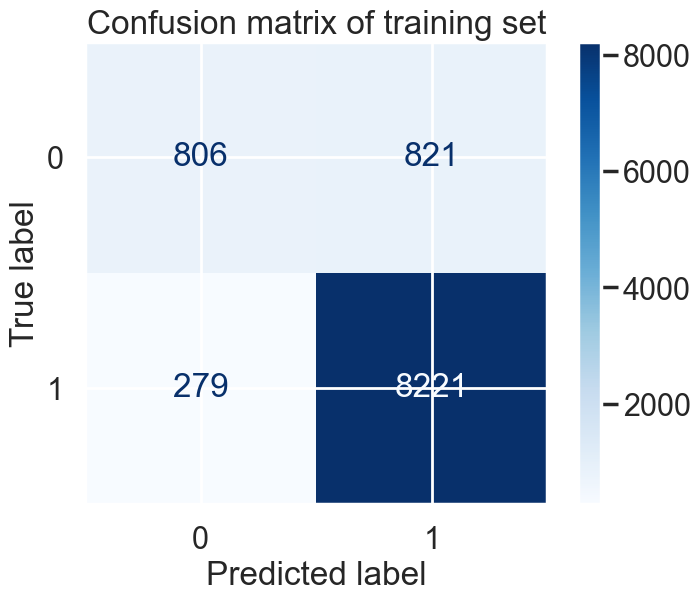

In [2188]:
# Plot confusion matrix of training set
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clfbm,
                      xbm,
                      ybm,
                      display_labels=list(set(ybm_test)),
                      cmap=plt.cm.Blues) 
plt.title('Confusion matrix of training set')
plt.show()  

In [2189]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix
ybm_pred_train = clfbm.predict(xbm_train)
print("Classification report on Train data\n=======================")
print(classification_report(y_true=ybm_train, y_pred=ybm_pred_train))
print("Confusion matrix on Train data\n=======================")

print(confusion_matrix(y_true=ybm_train, y_pred=ybm_pred_train))

Classification report on Train data
              precision    recall  f1-score   support

           0       0.75      0.50      0.60      1318
           1       0.91      0.97      0.94      6783

    accuracy                           0.89      8101
   macro avg       0.83      0.73      0.77      8101
weighted avg       0.88      0.89      0.88      8101

Confusion matrix on Train data
[[ 654  664]
 [ 220 6563]]


In [2190]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix
ybm_pred_test = clfbm.predict(xbm_test)
print("Classification report on Test data\n=======================")
print(classification_report(y_true=ybm_test, y_pred=ybm_pred_test))
print("Confusion matrix on Test data\n=======================")

print(confusion_matrix(y_true=ybm_test, y_pred=ybm_pred_test))

Classification report on Test data
              precision    recall  f1-score   support

           0       0.72      0.49      0.58       309
           1       0.91      0.97      0.94      1717

    accuracy                           0.89      2026
   macro avg       0.82      0.73      0.76      2026
weighted avg       0.88      0.89      0.88      2026

Confusion matrix on Test data
[[ 152  157]
 [  59 1658]]


### **Check Values of Numerical Features**

In [2191]:
df.isnull().sum()

Customer_Age                0
Dependent_count             0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
Gender                      0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Attrition_Flag              0
dtype: int64

In [2192]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


<AxesSubplot:xlabel='Avg_Utilization_Ratio', ylabel='Count'>

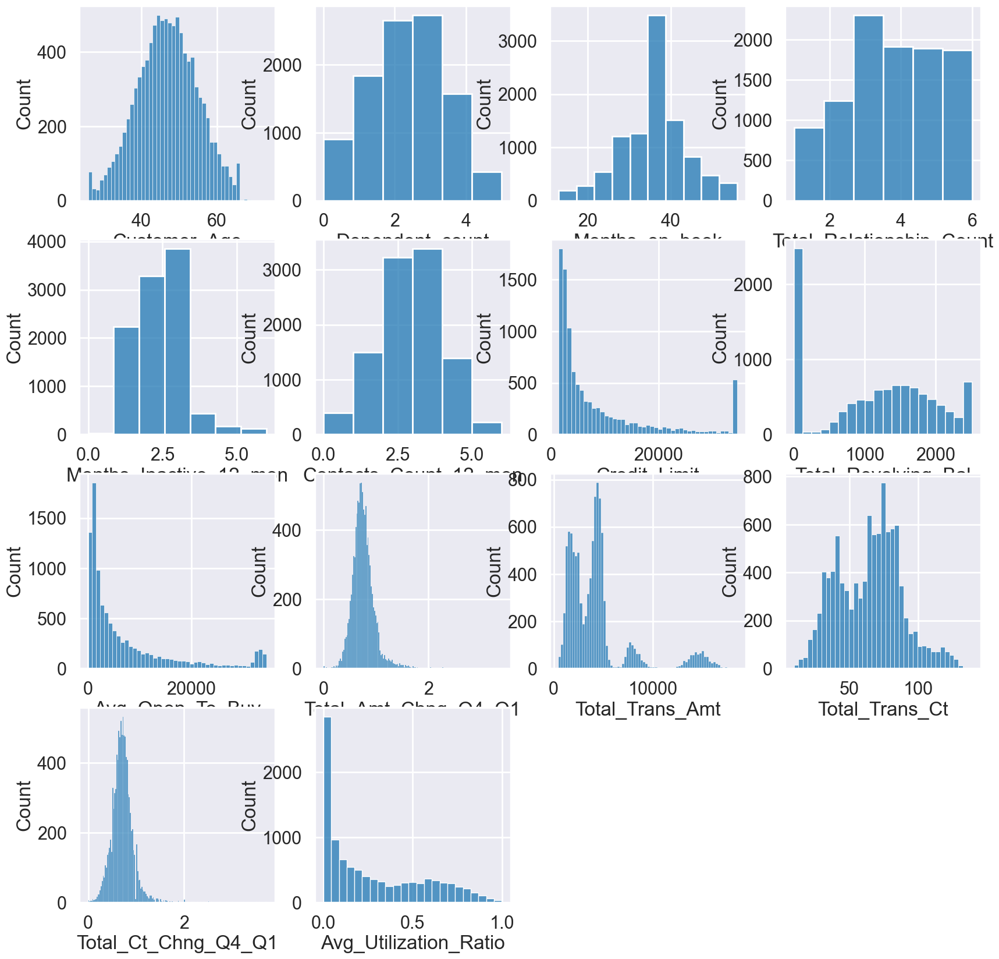

In [2193]:
# plot numerical data
plt.figure(figsize=(20,20))
plt.subplot(441) 
sns.histplot(df['Customer_Age'])
plt.subplot(442) 
sns.histplot(df['Dependent_count'],bins=6)
plt.subplot(443) 
sns.histplot(df['Months_on_book'],bins=10)
plt.subplot(444) 
sns.histplot(df['Total_Relationship_Count'],bins=6)
plt.subplot(445) 
sns.histplot(df['Months_Inactive_12_mon'],bins=7)
plt.subplot(446) 
sns.histplot(df['Contacts_Count_12_mon'],bins=6)
plt.subplot(447) 
sns.histplot(df['Credit_Limit'])
plt.subplot(448) 
sns.histplot(df['Total_Revolving_Bal'])
plt.subplot(449) 
sns.histplot(df['Avg_Open_To_Buy'])
plt.subplot(4,4,10) 
sns.histplot(df['Total_Amt_Chng_Q4_Q1'])
plt.subplot(4,4,11)
sns.histplot(df['Total_Trans_Amt'])
plt.subplot(4,4,12)
sns.histplot(df['Total_Trans_Ct'])
plt.subplot(4,4,13)
sns.histplot(df['Total_Ct_Chng_Q4_Q1'])
plt.subplot(4,4,14)
sns.histplot(df['Avg_Utilization_Ratio'])

What we got from plotting values of numerical features:

|Feature Names|Normally Distributed|
|-|-|
|Customer_Age|Yes|
|Dependent_Count|Yes|
|Months_on_book|Yes|
|Total_Relationship_Count|No|
|Months_Inactive_12_mon|Almost|
|Contacts_Count_12_mon|Yes|
|Credit_Limit|No|
|Total_Revolving_Bal|No|
|Avg_Open_To_Buy|No|
|Total_Amt_Chng_Q4_Q1|Almost|
|Total_Trans_Amt|No|
|Total_Trans_Ct|Almost|
|Total_Ct_Chng_Q4_Q1|Almost|
|Avg_Utilization_Ratio|No|

### **Check Values of Categorical Features**

In [2194]:
df['Gender'].value_counts()

F    5358
M    4769
Name: Gender, dtype: int64

In [2195]:
# Calculate Percentage of Gender
100*df['Gender'].value_counts()/len(df)

F    52.908068
M    47.091932
Name: Gender, dtype: float64

In [2196]:
df['Education_Level'].value_counts()

Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [2197]:
# Calculate Percentage of Education Level
100*df['Education_Level'].value_counts()/len(df)

Graduate         30.887726
High School      19.877555
Unknown          14.999506
Uneducated       14.683519
College          10.002962
Post-Graduate     5.095290
Doctorate         4.453441
Name: Education_Level, dtype: float64

In [2198]:
df['Marital_Status'].value_counts()

Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64

In [2199]:
# Calculate Percentage of Marital Status
100*df['Marital_Status'].value_counts()/len(df)

Married     46.282216
Single      38.935519
Unknown      7.396070
Divorced     7.386195
Name: Marital_Status, dtype: float64

In [2200]:
df['Income_Category'].value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

In [2201]:
# Calculate Percentage of Income Category
100*df['Income_Category'].value_counts()/len(df)

Less than $40K    35.163425
$40K - $60K       17.675521
$80K - $120K      15.157500
$60K - $80K       13.844179
Unknown           10.980547
$120K +            7.178829
Name: Income_Category, dtype: float64

In [2202]:
df['Card_Category'].value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

In [2203]:
# Calculate Percentage of Card Category
100*df['Card_Category'].value_counts()/len(df)

Blue        93.176656
Silver       5.480399
Gold         1.145453
Platinum     0.197492
Name: Card_Category, dtype: float64

<AxesSubplot:title={'center':'Card Category'}>

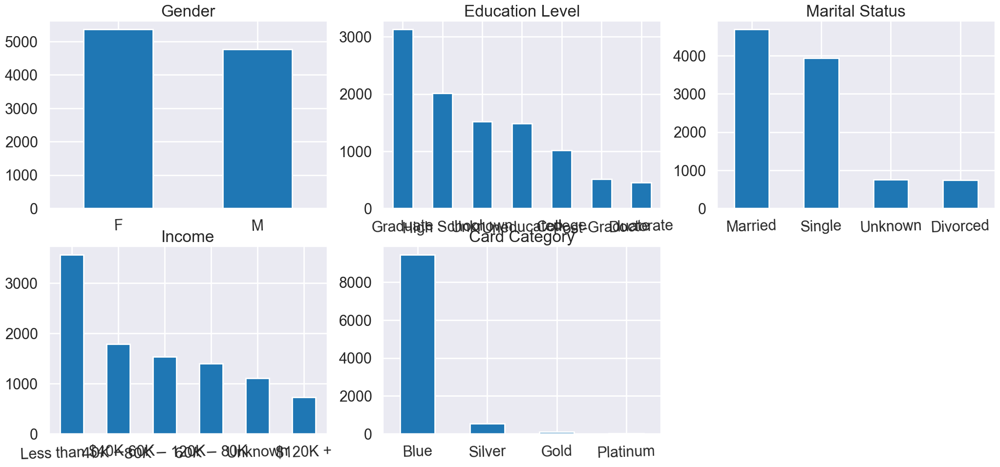

In [2204]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
df['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
df['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
df['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
df['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
df['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

What we got from plotting values of categorical features:

|Feature Names|What we got|
|-|-|
|Gender|There are nearly the same amount of male and female.|
|Education_Level|Most of the people in this dataset are 'Graduate' and around 15% of the people are 'Unknown'|
|Marital_Status|46% of this data are 'Married', 39% are 'Single' and the rest are 'Unknown' or 'Divorced'|
|Income_Category|Most people in this dataset have 'less than 40K' income|
|Card_Category|People in this dataset mostly hold blue cards (more than 93%) and the rest hold the other 3 cards (less than 7%).|

### **Check Behaviour of Attrition_Flag**

In [2205]:
dfAtt = df[df['Attrition_Flag'] == 0]
dfAtt

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
21,62,0,49,2,3,3,1438.3,0,1438.3,1.047,692,16,0.600,0.000,F,Graduate,Married,Less than $40K,Blue,0
39,66,0,56,5,4,3,7882.0,605,7277.0,1.052,704,16,0.143,0.077,F,Doctorate,Married,Unknown,Blue,0
51,54,1,40,2,3,1,1438.3,808,630.3,0.997,705,19,0.900,0.562,F,Graduate,Married,Less than $40K,Blue,0
54,56,2,36,1,3,3,15769.0,0,15769.0,1.041,602,15,0.364,0.000,M,Graduate,Married,$120K +,Blue,0
61,48,2,35,2,4,4,34516.0,0,34516.0,0.763,691,15,0.500,0.000,M,Graduate,Married,$60K - $80K,Silver,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10119,55,3,47,4,3,3,14657.0,2517,12140.0,0.166,6009,53,0.514,0.172,F,Uneducated,Single,Unknown,Blue,0
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,M,Unknown,Divorced,$40K - $60K,Blue,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,F,High School,Married,Less than $40K,Blue,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,M,Graduate,Unknown,$40K - $60K,Blue,0


In [2206]:
dfExist = df[df['Attrition_Flag'] == 1]
dfExist

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,M,High School,Married,$60K - $80K,Blue,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,F,Graduate,Single,Less than $40K,Blue,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,M,Graduate,Married,$80K - $120K,Blue,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,F,High School,Unknown,Less than $40K,Blue,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,M,Uneducated,Married,$60K - $80K,Blue,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10116,46,5,36,1,2,3,13187.0,2241,10946.0,0.689,15354,112,0.931,0.170,M,College,Single,$80K - $120K,Blue,1
10117,57,2,40,6,3,4,17925.0,1909,16016.0,0.712,17498,111,0.820,0.106,M,Graduate,Married,$80K - $120K,Blue,1
10120,54,1,34,5,2,0,13940.0,2109,11831.0,0.660,15577,114,0.754,0.151,M,High School,Single,$60K - $80K,Blue,1
10121,56,1,50,4,1,4,3688.0,606,3082.0,0.570,14596,120,0.791,0.164,F,Graduate,Single,Less than $40K,Blue,1


### **Plot Features of Attrited Customers**

<AxesSubplot:title={'center':'Card Category'}>

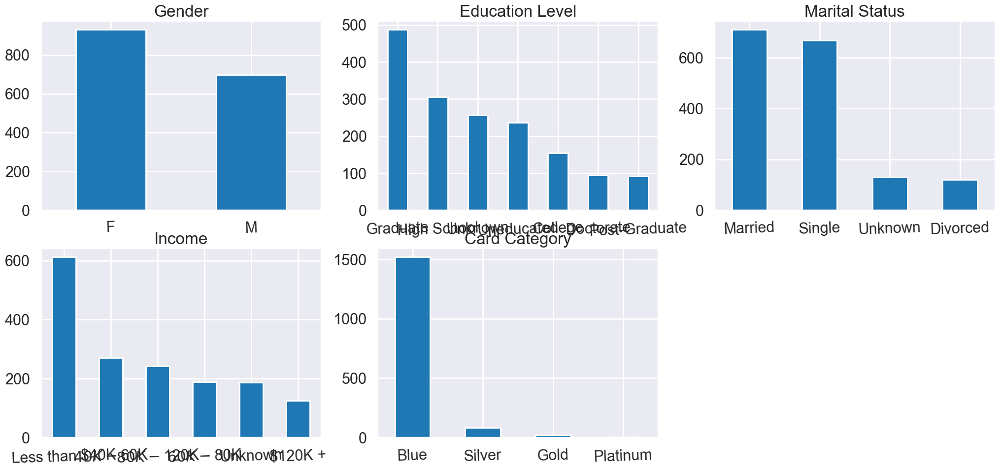

In [2207]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
dfAtt['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
dfAtt['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
dfAtt['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
dfAtt['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
dfAtt['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

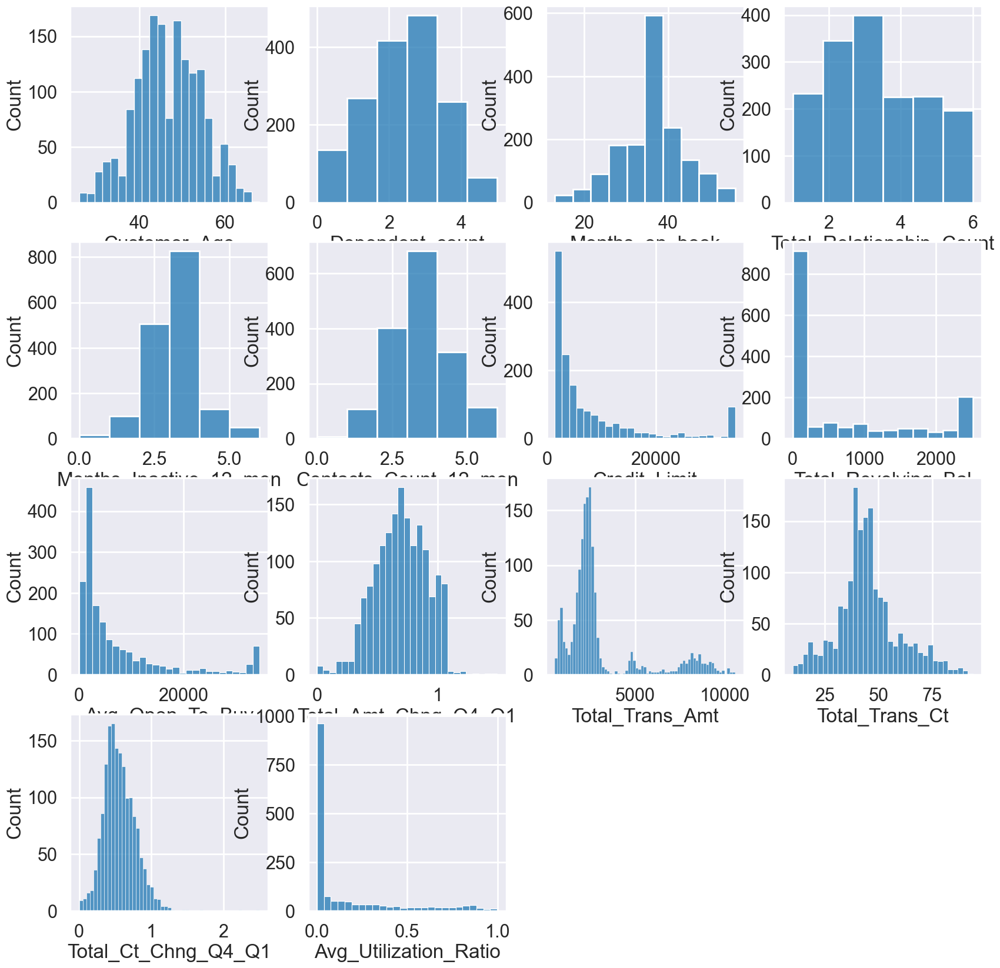

In [2208]:
# plot numerical data
plt.figure(figsize=(20,20))

for idx, col in enumerate(dfNum.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(4,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfAtt[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfAtt[col],bins=10)
        else:
            sns.histplot(dfAtt[col])

### **Plot Features of Existing Customers**

<AxesSubplot:title={'center':'Card Category'}>

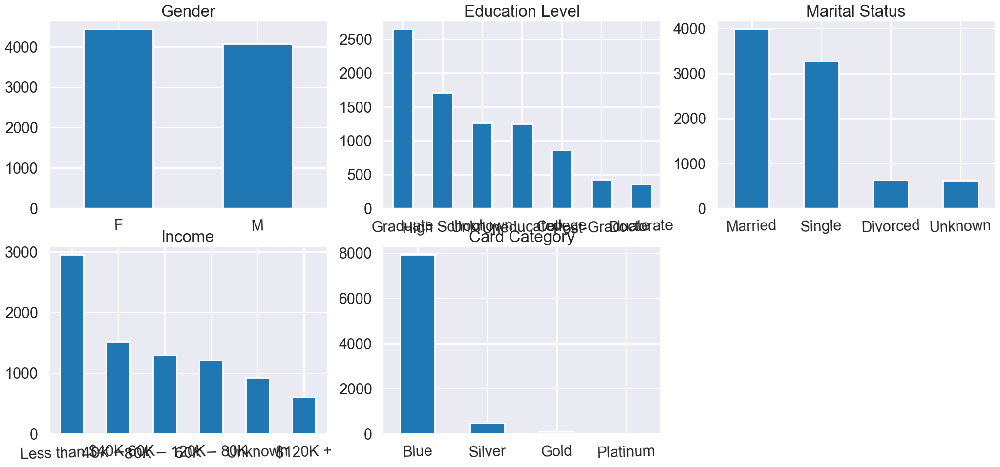

In [2209]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
dfExist['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
dfExist['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
dfExist['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
dfExist['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
dfExist['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

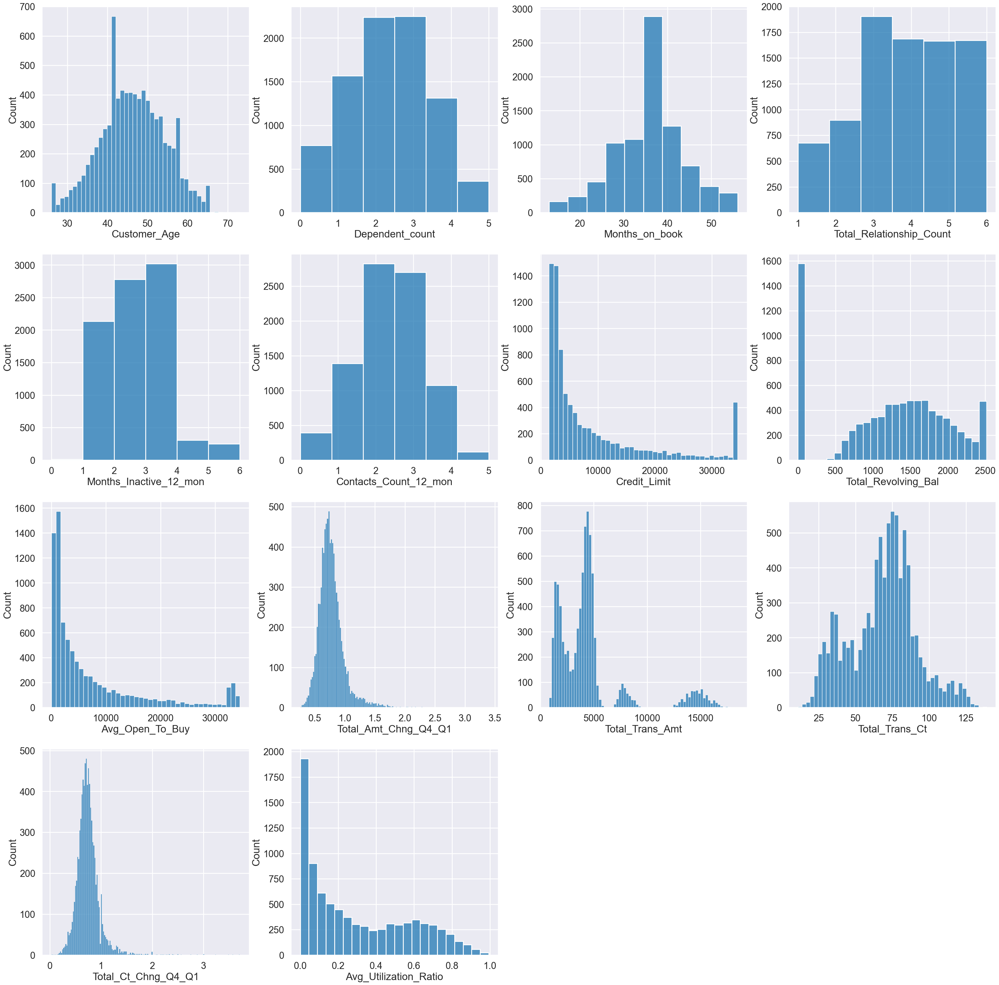

In [2210]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(dfNum.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(4,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfExist[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfExist[col],bins=10)
        else:
            sns.histplot(dfExist[col])

### **Pairplot Interesting Features**

In [2211]:
# sns.pairplot(df[['Attrition_Flag','Total_Relationship_Count', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1','Avg_Utilization_Ratio']], diag_kind="hist", hue="Attrition_Flag")

Good and Bad things of this dataset:

|Good Things|Explanation|
|-|-|
|Data Distribution|Most Numerical data are normally distributed.|
|Filled Data in Numerical Features|There are no missing data (NaN) or unknown in numerical features of this dataset.|

<hr>

|Bad Things|Explanation|
|-|-|
|Data Explanation|Most features come with little to no explanation or bad explanation, eg. Avg_Open_To_Buy.|
|'Card_Category' Features|This feature's data are mostly 'Blue' (around 93%).|
|Unknown Data|Unclear explanation of what unknown data means and there are a lot of them in categorical features.|
|Data Variation|As we can see when pairplotting, variance between features are quite low and variance within class are quite high, which means that data variation is very bad.|

**NOTE**: For all 'Unknown' data in categorical features, we assumed 'Unknown' as a type of data because there are quite a lot of 'Unknown' data.

Furthermore, because we are dealing with a credit card dataset, which can be considered as a dataset provided by a bank, those 'Unknown' data might be undisclosed information of the customers.

### **Check Correlation between Numerical Features**

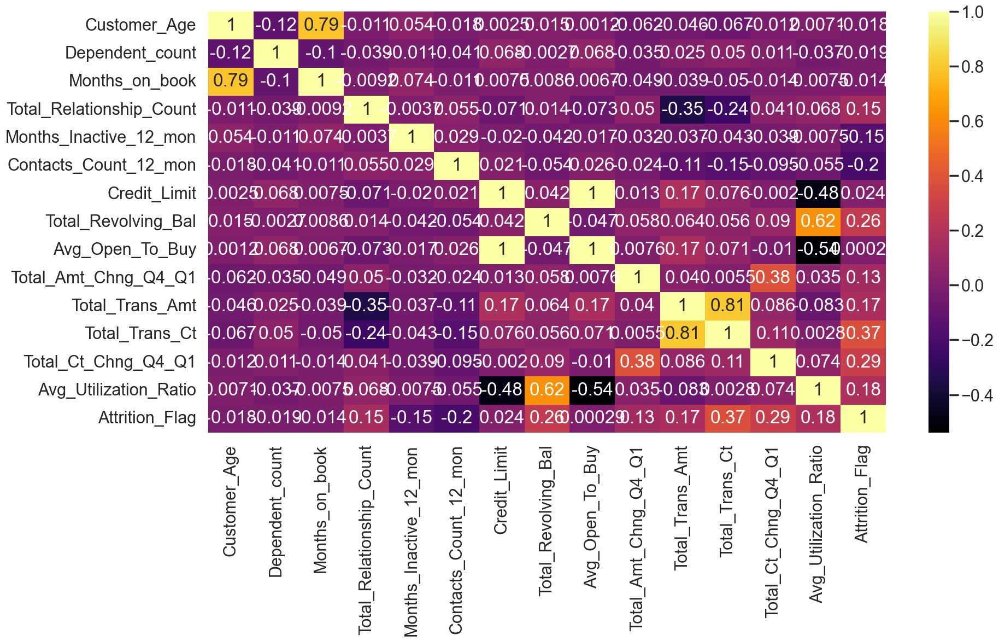

In [2212]:
checkCorrFF(df)

From the heatmap above, we can drop these features:

|Feature Names|Reasons|
|-|-|
|Customer_Age|Looking at the heatmap, it correlates with 'Months_on_Book' (79%). We assumed that 'Months_on_Book' is more useful than 'Customer_Age'.|
|Credit_Limit|Looking at the heatmap, 'Credit_Limit' and 'Avg_Open_To_Buy' perfectly correlate to each other.|
|Total_Trans_Amt|Looking at the heatmap, it correlates with 'Total_Trans_Ct' (81%) and correlates with other features quite a lot.|
|Total_Amt_Chng_Q4_Q1|Looking at the heatmap, it correlates with 'Total_Ct_Chng_Q4_Q1' (38%).|
|Avg_Utilization_Ratio|Looking at the heatmap, it correlates too much with 3 features, 'Credit_Limit', 'Total_Revolving_Bal' and 'Avg_Open_To_Buy'.|

# **Resampling Method 1** : SMOTE (Synthetic Minority Oversampling TEchnique)
<hr>

## **Data Preprocessing**
### **Label and One hot Encoding**

<AxesSubplot:ylabel='Type'>

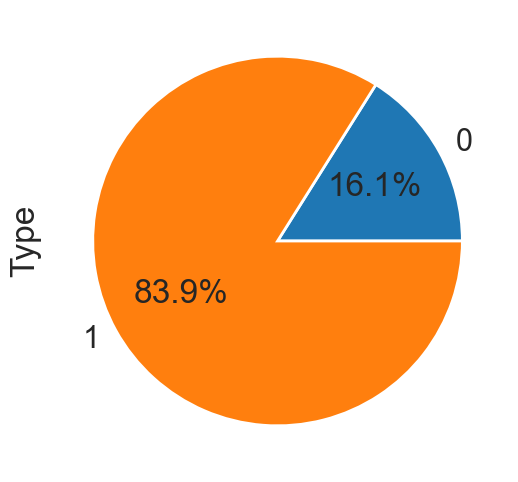

In [2213]:
sns.set_style("darkgrid")
sns.set_context("poster")
plt.rcParams["figure.figsize"] = [8,6]

df.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

In [2214]:
df_LE = df.copy()

df_LE['Gender'] = df_LE['Gender'].apply(lambda x: ['M', 'F'].index(x))
df_LE['Education_Level'] = df_LE['Education_Level'].apply(lambda x: ['Unknown', 'Uneducated', 'High School', 'College', 'Graduate', 'Post-Graduate', 'Doctorate'].index(x))
df_LE['Income_Category'] = df_LE['Income_Category'].apply(lambda x: ['Unknown', 'Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K', '$120K +'].index(x))

df_LE['Card_Category'] = df_LE['Card_Category'].map({'Silver' : 'NotBlue','Gold': 'NotBlue','Platinum': 'NotBlue'})
# df_LE['Card_Category'] = df_LE['Card_Category'].apply(lambda x: ['Blue', 'Silver', 'Gold', 'Platinum'].index(x))

x_LE = df_LE.drop(['Attrition_Flag'], axis = 1)
y_LE = df_LE['Attrition_Flag']
x_LE = pd.get_dummies(x_LE)

df_LE = pd.concat([x_LE, y_LE], axis=1)

df_LE

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,...,0.061,0,2,3,0,1,0,0,0,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,...,0.105,1,4,1,0,0,1,0,0,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,...,0.000,0,4,4,0,1,0,0,0,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,...,0.760,1,2,1,0,0,0,1,0,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,...,0.000,0,1,3,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,...,0.462,0,4,2,0,0,1,0,0,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,...,0.511,0,0,2,1,0,0,0,0,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,...,0.000,1,2,1,0,1,0,0,0,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,...,0.000,0,4,2,0,0,0,1,0,0


### **Resampling**

In [2215]:
X = df_LE.drop(['Attrition_Flag'], axis=1)
y = df_LE['Attrition_Flag']

su = SMOTE(random_state=42)
X_su, y_su = su.fit_resample(X, y)
df_upsampled = pd.concat([X_su, y_su], axis=1)

1    8500
0    8500
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

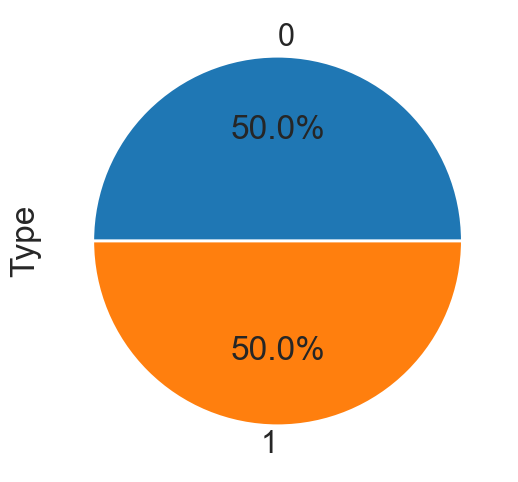

In [2216]:
print(df_upsampled["Attrition_Flag"].value_counts())

df_upsampled.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

In [2217]:
df_upsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,...,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000
mean,46.268000,2.221059,35.854471,3.452824,2.359882,2.524941,8402.719440,952.554471,7450.081104,0.731907,...,0.229053,0.478294,2.448059,1.919176,0.046118,0.353882,0.303059,0.046235,0.051118,0.500000
std,7.340079,1.211337,7.373028,1.506738,0.910690,1.028548,9093.879050,885.483077,9102.020425,0.210247,...,0.277267,0.499543,1.604492,1.403083,0.209746,0.478187,0.459594,0.210000,0.220244,0.500015
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,32.000000,2.000000,2.000000,2.000000,2395.000000,0.000000,1438.300000,0.604654,...,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,46.000000,2.000000,36.000000,3.000000,2.000000,3.000000,4332.580047,928.000000,3453.444526,0.721560,...,0.094011,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000
75%,51.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10410.250000,1686.250000,9549.893091,0.847705,...,0.417694,1.000000,4.000000,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,...,0.999000,1.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [2218]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


### **Data Transformation**

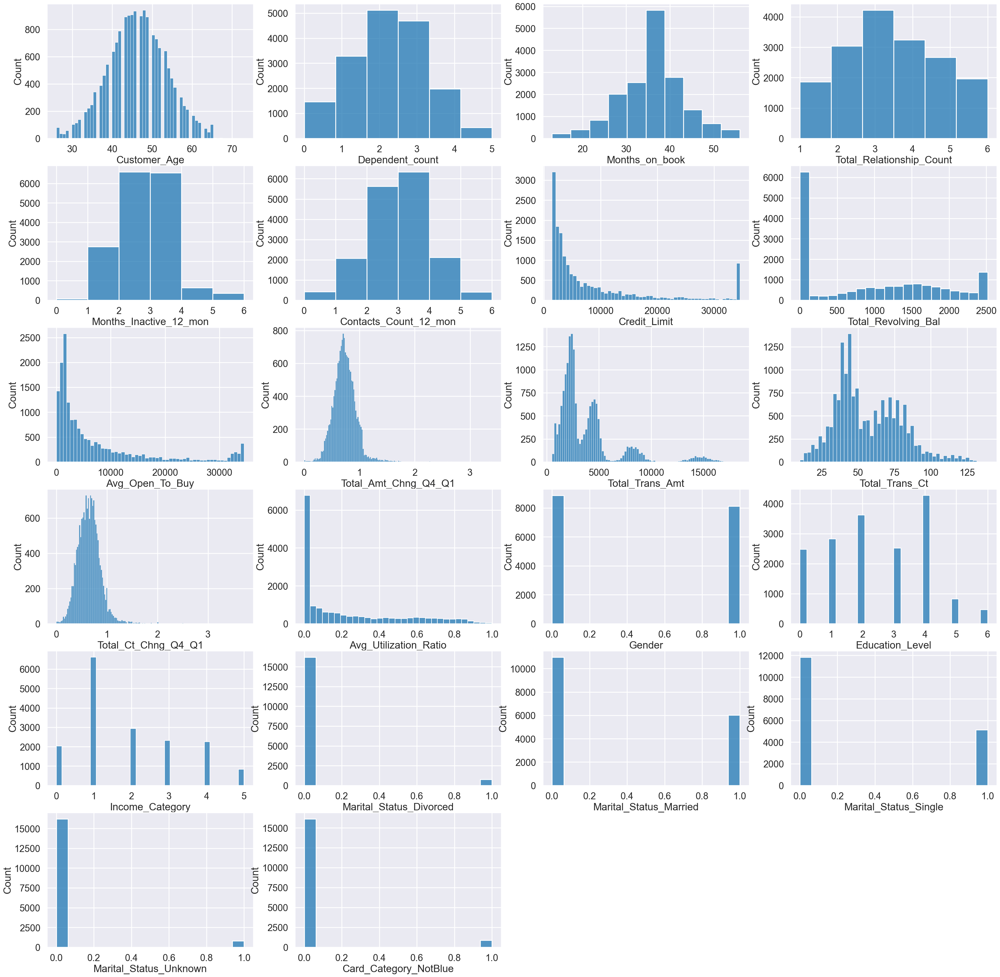

In [2219]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_upsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_upsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_upsampled[col],bins=10)
        else:
            sns.histplot(df_upsampled[col])

In [2220]:
df_upsampled.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender', 'Education_Level', 'Income_Category',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Card_Category_NotBlue', 'Attrition_Flag'],
      dtype='object')

In [2221]:
log_var = ['Credit_Limit','Avg_Open_To_Buy',
           'Total_Amt_Chng_Q4_Q1','Total_Ct_Chng_Q4_Q1']

for idx,col in enumerate(log_var):
    df_upsampled[col] = np.log10(df_upsampled[col]+1)

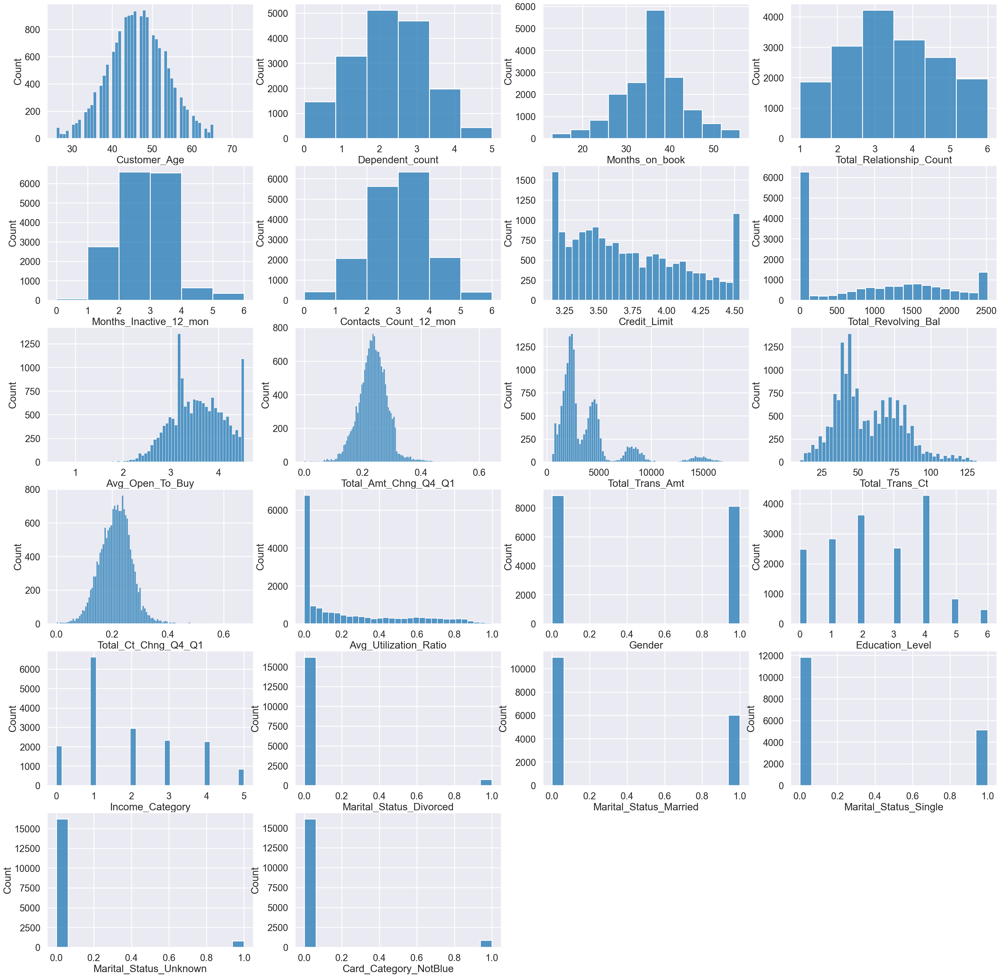

In [2222]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_upsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_upsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_upsampled[col],bins=10)
        else:
            sns.histplot(df_upsampled[col])

### **Clear outlier**

In [2223]:
# df_upsampled.boxplot(column=[str(i) for count, i in enumerate(df_upsampled.columns) if i != 'Attrition_Flag' and count < 10], figsize=(50,10), grid=False)

#### **Strip Plot**

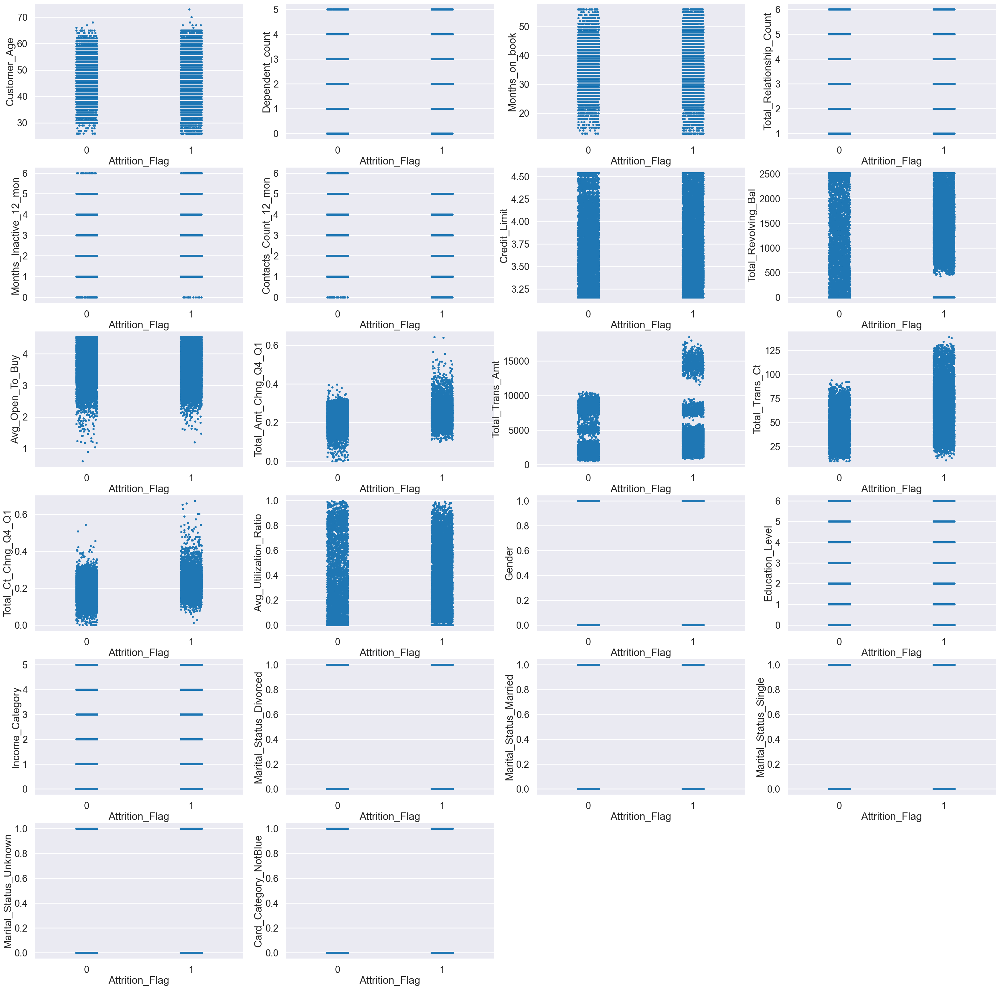

In [2224]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_upsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_upsampled)

#### **Remove Outliers**

In [2225]:
df_upsampled.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender', 'Education_Level', 'Income_Category',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Card_Category_NotBlue', 'Attrition_Flag'],
      dtype='object')

In [2226]:
print('Before remove outlier, the shape of df_upsampled: {}'.format(df_upsampled.shape))

df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Avg_Open_To_Buy'] <= 2.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Avg_Open_To_Buy'] <= 2.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print('df_upsampled.shape after remove outlier Avg_Open_To_Buy : {}'.format(df_upsampled.shape))

df_upsampled = IQRdrop(df_upsampled, 'Total_Amt_Chng_Q4_Q1')
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 0.38].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 0.5].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# print('df_upsampled.shape after remove outlier Total_Amt_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Trans_Amt'] >= 16000].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# print('df_upsampled.shape after remove outlier Total_Trans_Amt : {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Trans_Ct'] >= 127].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print('df_upsampled.shape after remove outlier Total_Trans_Amt : {}'.format(df_upsampled.shape))


df_upsampled = IQRdrop(df_upsampled, 'Total_Ct_Chng_Q4_Q1')
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 0.5].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] <= 0.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# print('df_upsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 0.55].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] <= 0.05].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print('df_upsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

df_upsampled = IQRdrop(df_upsampled, 'Customer_Age')
print('df_upsampled.shape after remove outlier Customer_Age : {}'.format(df_upsampled.shape))

Before remove outlier, the shape of df_upsampled: (17000, 23)
df_upsampled.shape after remove outlier Avg_Open_To_Buy : (16932, 23)
df_upsampled.shape after remove outlier Total_Trans_Amt : (16501, 23)
df_upsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : (16262, 23)
df_upsampled.shape after remove outlier Customer_Age : (16257, 23)


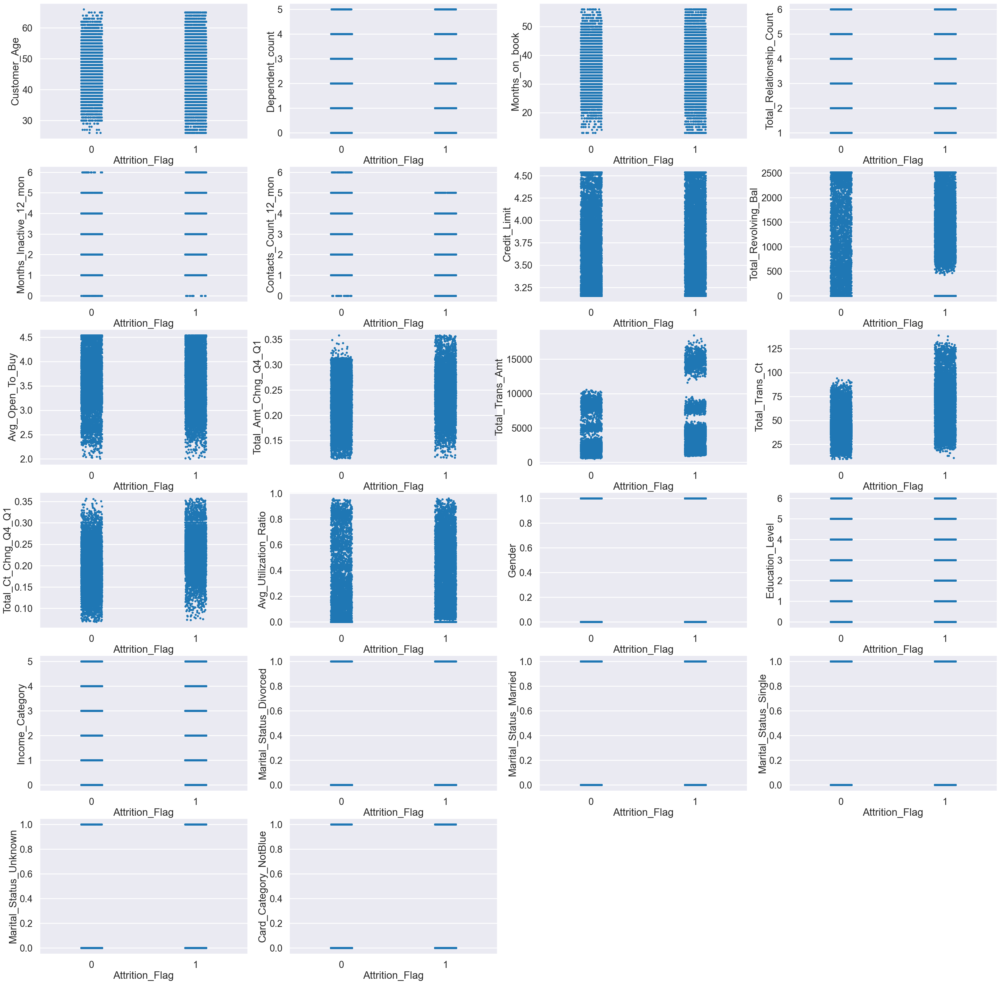

In [2227]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_upsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_upsampled)

### **Feature Scaling (Numerical)**

In [2228]:
robust_scaler = RobustScaler()
min_max_scaler = MinMaxScaler()

for idx in df_upsampled.columns:
    if idx not in ['Attrition_Flag']:
        df_upsampled[idx]=min_max_scaler.fit_transform(df_upsampled[idx].values.reshape(-1,1))

In [2229]:
df_upsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,...,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000,16257.000000
mean,0.507097,0.444510,0.531754,0.489217,0.393636,0.420291,0.405220,0.375087,0.614107,0.492644,...,0.234336,0.479424,0.408870,0.382580,0.046257,0.346128,0.307375,0.046811,0.051547,0.496340
std,0.181835,0.242479,0.170192,0.301893,0.151882,0.171351,0.298486,0.351159,0.216074,0.178733,...,0.284422,0.499592,0.266946,0.280048,0.210048,0.475749,0.461420,0.211239,0.221117,0.500002
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.375000,0.200000,0.441860,0.200000,0.333333,0.333333,0.160664,0.000000,0.455391,0.376859,...,0.000000,0.000000,0.166667,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.500000,0.400000,0.534884,0.400000,0.333333,0.500000,0.347086,0.362733,0.605957,0.496782,...,0.095634,0.000000,0.333333,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.625000,0.600000,0.627907,0.800000,0.500000,0.500000,0.620732,0.664283,0.778821,0.618171,...,0.428496,1.000000,0.666667,0.600000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [2230]:
df_upsampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16257 entries, 10 to 16999
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              16257 non-null  float64
 1   Dependent_count           16257 non-null  float64
 2   Months_on_book            16257 non-null  float64
 3   Total_Relationship_Count  16257 non-null  float64
 4   Months_Inactive_12_mon    16257 non-null  float64
 5   Contacts_Count_12_mon     16257 non-null  float64
 6   Credit_Limit              16257 non-null  float64
 7   Total_Revolving_Bal       16257 non-null  float64
 8   Avg_Open_To_Buy           16257 non-null  float64
 9   Total_Amt_Chng_Q4_Q1      16257 non-null  float64
 10  Total_Trans_Amt           16257 non-null  float64
 11  Total_Trans_Ct            16257 non-null  float64
 12  Total_Ct_Chng_Q4_Q1       16257 non-null  float64
 13  Avg_Utilization_Ratio     16257 non-null  float64
 14  Gende

### **Feature Selection**

In [2314]:
selector = SelectKBest(f_classif, k=10)
x_up = df_upsampled.drop(['Attrition_Flag'], axis = 1)
y_up = df_upsampled['Attrition_Flag']

df_up_anova = selector.fit(x_up, y_up)

col = selector.get_support(indices=True)
df_up_anova = x_up.iloc[:,col]

#### **Concatenate Data**

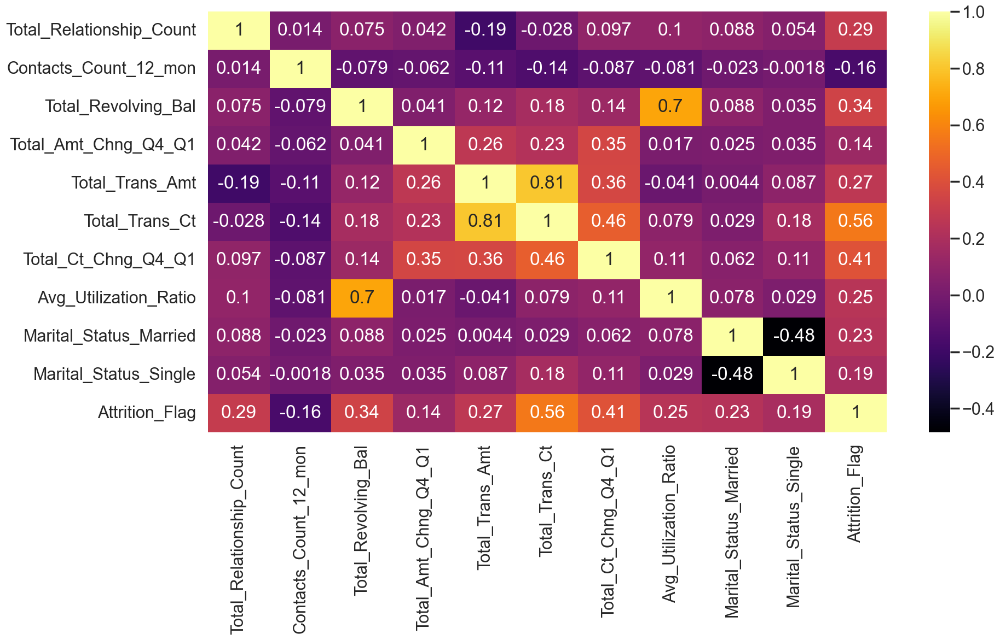

In [2315]:
df_up_anova = pd.concat([df_up_anova, y_up], axis=1)
checkCorrFF(df_up_anova)

In [2316]:
df_up_anova.columns

Index(['Total_Relationship_Count', 'Contacts_Count_12_mon',
       'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Marital_Status_Married', 'Marital_Status_Single', 'Attrition_Flag'],
      dtype='object')

In [2317]:
# df_up_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Total_Amt_Chng_Q4_Q1'], axis=1, inplace=True)
df_up_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Marital_Status_Single'], axis=1, inplace=True)

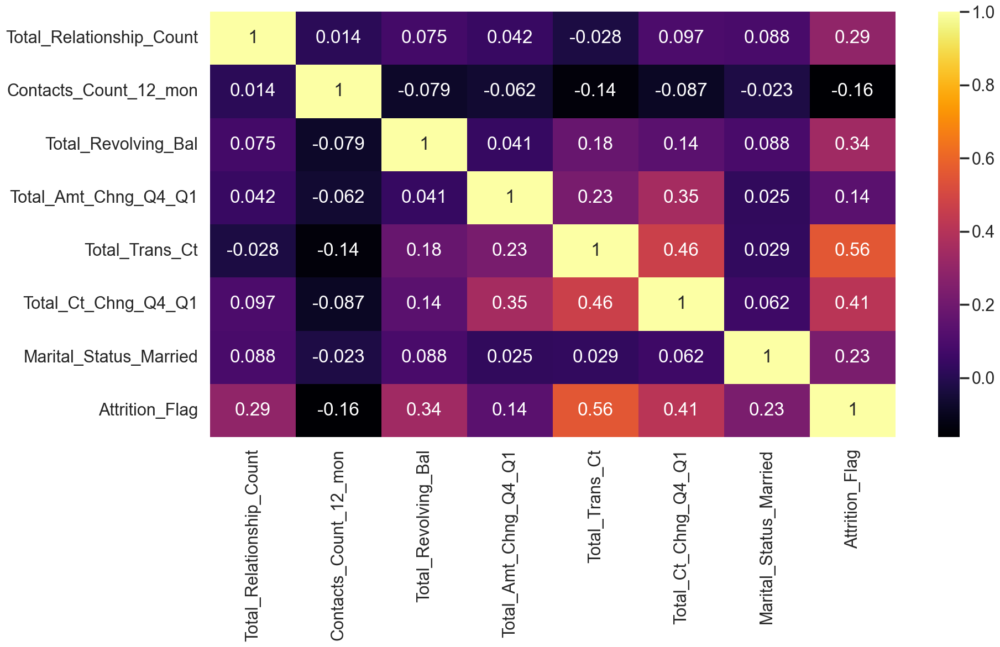

In [2318]:
checkCorrFF(df_up_anova)

## **Model Training**

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.844393 se=0.001997
>f1 score 2 mean=0.844259 se=0.001369
>f1 score 3 mean=0.844339 se=0.001067
>f1 score 4 mean=0.844220 se=0.001123
>f1 score 5 mean=0.844130 se=0.001159


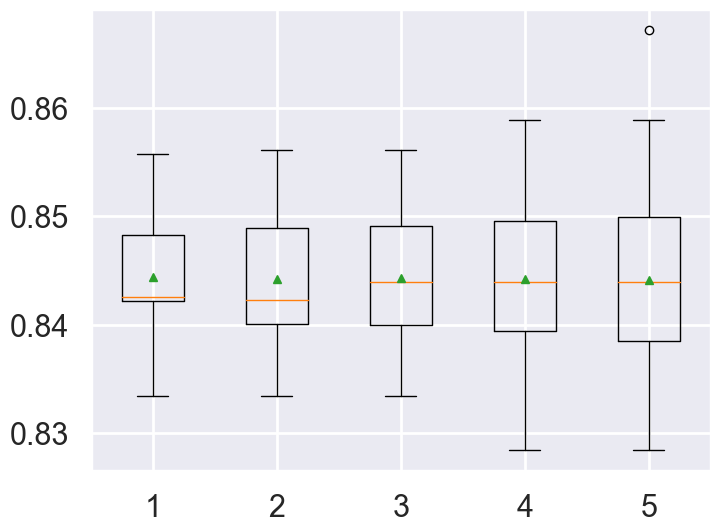

In [2319]:
# create dataset
X_up_anova = df_up_anova.drop(['Attrition_Flag'], axis = 1)
y_up_anova = df_up_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_up_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_up_anova = evaluate_model(X_up_anova, y_up_anova, r,'f1')
	# summarize
	print('>f1 score %d mean=%.6f se=%.6f' % (r, np.mean(scores_up_anova), sem(scores_up_anova)))
	# store
	results_up_anova.append(scores_up_anova)
# plot the results
plt.boxplot(results_up_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [2321]:
#get the dummy variables for the categorical variables
x_up_anova = df_up_anova.drop(['Attrition_Flag'], axis = 1)
y_up_anova = df_up_anova['Attrition_Flag']

x_up_anova_train,x_up_anova_test,y_up_anova_train,y_up_anova_test = train_test_split(x_up_anova, y_up_anova, test_size = 0.2, random_state = 0)

grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_up_anova=LogisticRegression()
logreg_cv_up_anova=GridSearchCV(logreg_up_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1'
                       ,n_jobs=-1)
logreg_cv_up_anova.fit(x_up_anova_train,y_up_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_up_anova.best_params_)
print("f1 :",logreg_cv_up_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1000000.0, 'penalty': 'none', 'solver': 'sag'}
f1 : 0.8473218974548278


In [2322]:
clf_up_anova = LogisticRegression(C=logreg_cv_up_anova.best_params_['C'], penalty=logreg_cv_up_anova.best_params_['penalty'], solver=logreg_cv_up_anova.best_params_['solver'])

clf_up_anova.fit(x_up_anova_train,y_up_anova_train)
print("model score: %.8f" % clf_up_anova.score(x_up_anova_test, y_up_anova_test))

model score: 0.83640836


### **Classification report**

In [2323]:
# Classification report
y_up_anova_pred = clf_up_anova.predict(x_up_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_up_anova_train, y_pred=y_up_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_up_anova_train, y_pred=y_up_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.85      0.85      0.85      6537
           1       0.85      0.85      0.85      6468

    accuracy                           0.85     13005
   macro avg       0.85      0.85      0.85     13005
weighted avg       0.85      0.85      0.85     13005

Confusion matrix 
[[5542  995]
 [ 984 5484]]


In [2324]:
# Classification report
y_up_anova_pred = clf_up_anova.predict(x_up_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_up_anova_test, y_pred=y_up_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_up_anova_test, y_pred=y_up_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.84      0.83      0.84      1651
           1       0.83      0.84      0.83      1601

    accuracy                           0.84      3252
   macro avg       0.84      0.84      0.84      3252
weighted avg       0.84      0.84      0.84      3252

Confusion matrix 
[[1374  277]
 [ 255 1346]]


# **Resampling Method 2** : Downsampling
<hr>

## **Data Preprocessing**
### **Resampling**

In [2242]:
df_LE

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,...,0.061,0,2,3,0,1,0,0,0,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,...,0.105,1,4,1,0,0,1,0,0,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,...,0.000,0,4,4,0,1,0,0,0,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,...,0.760,1,2,1,0,0,0,1,0,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,...,0.000,0,1,3,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,...,0.462,0,4,2,0,0,1,0,0,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,...,0.511,0,0,2,1,0,0,0,0,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,...,0.000,1,2,1,0,1,0,0,0,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,...,0.000,0,4,2,0,0,0,1,0,0


In [2243]:
Att0_messages = df_LE[df_LE["Attrition_Flag"] == 0]
Att1_messages  = df_LE[df_LE["Attrition_Flag"] == 1]
print(Att0_messages.shape)
print(Att1_messages.shape)

(1627, 23)
(8500, 23)


In [2244]:
Att_dwsample = resample(Att1_messages,
             replace=True,
             n_samples=len(Att0_messages),
             random_state=42)

print(Att_dwsample.shape)

(1627, 23)


1    1627
0    1627
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

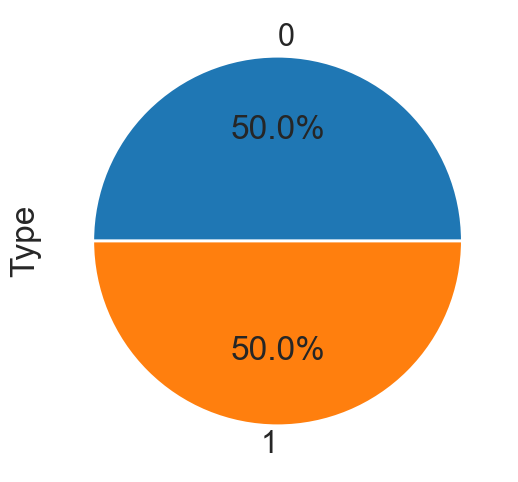

In [2245]:
df_dwsampled = pd.concat([Att_dwsample, Att0_messages])

print(df_dwsampled["Attrition_Flag"].value_counts())

df_dwsampled.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

In [2246]:
df_dwsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,...,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000
mean,46.347265,2.359250,35.773817,3.573448,2.485864,2.660725,8290.062569,963.211125,7326.851444,0.730707,...,0.231552,0.550092,2.639521,2.051936,0.069453,0.448986,0.404733,0.076829,0.065151,0.500000
std,7.938040,1.293536,7.957958,1.591356,0.997206,1.127779,8934.789490,893.995153,8941.778905,0.219960,...,0.276535,0.497561,1.721115,1.464008,0.254262,0.497467,0.490916,0.266360,0.246829,0.500077
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,2.000000,2.000000,2.000000,2422.000000,0.000000,1438.300000,0.597250,...,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,46.000000,2.000000,36.000000,3.000000,3.000000,3.000000,4386.000000,908.000000,3471.500000,0.718000,...,0.102000,1.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10195.000000,1701.750000,9380.250000,0.853000,...,0.420000,1.000000,4.000000,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,68.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,2.275000,...,0.999000,1.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [2247]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


### **Feature Scaling (Numerical)**

In [2248]:
min_max_scaler = MinMaxScaler()

for idx in df_dwsampled.columns:
    if idx not in ['Attrition_Flag']:
        df_dwsampled[idx]=min_max_scaler.fit_transform(df_dwsampled[idx].values.reshape(-1,1))

In [2249]:
df_dwsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,...,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000
mean,0.484459,0.471850,0.529624,0.514690,0.414311,0.443454,0.207141,0.382682,0.212206,0.321190,...,0.231783,0.550092,0.439920,0.410387,0.069453,0.448986,0.404733,0.076829,0.065151,0.500000
std,0.189001,0.258707,0.185069,0.318271,0.166201,0.187963,0.270115,0.355183,0.259084,0.096686,...,0.276812,0.497561,0.286853,0.292802,0.254262,0.497467,0.490916,0.266360,0.246829,0.500077
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.357143,0.200000,0.418605,0.200000,0.333333,0.333333,0.029739,0.000000,0.041587,0.262527,...,0.000000,0.000000,0.166667,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.476190,0.400000,0.534884,0.400000,0.500000,0.500000,0.089114,0.360747,0.100498,0.315604,...,0.102102,1.000000,0.500000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000
75%,0.619048,0.600000,0.627907,0.800000,0.500000,0.500000,0.264731,0.676103,0.271702,0.374945,...,0.420420,1.000000,0.666667,0.600000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [2250]:
df_dwsampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3254 entries, 8572 to 10126
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              3254 non-null   float64
 1   Dependent_count           3254 non-null   float64
 2   Months_on_book            3254 non-null   float64
 3   Total_Relationship_Count  3254 non-null   float64
 4   Months_Inactive_12_mon    3254 non-null   float64
 5   Contacts_Count_12_mon     3254 non-null   float64
 6   Credit_Limit              3254 non-null   float64
 7   Total_Revolving_Bal       3254 non-null   float64
 8   Avg_Open_To_Buy           3254 non-null   float64
 9   Total_Amt_Chng_Q4_Q1      3254 non-null   float64
 10  Total_Trans_Amt           3254 non-null   float64
 11  Total_Trans_Ct            3254 non-null   float64
 12  Total_Ct_Chng_Q4_Q1       3254 non-null   float64
 13  Avg_Utilization_Ratio     3254 non-null   float64
 14  Gend

### **Clear outlier**

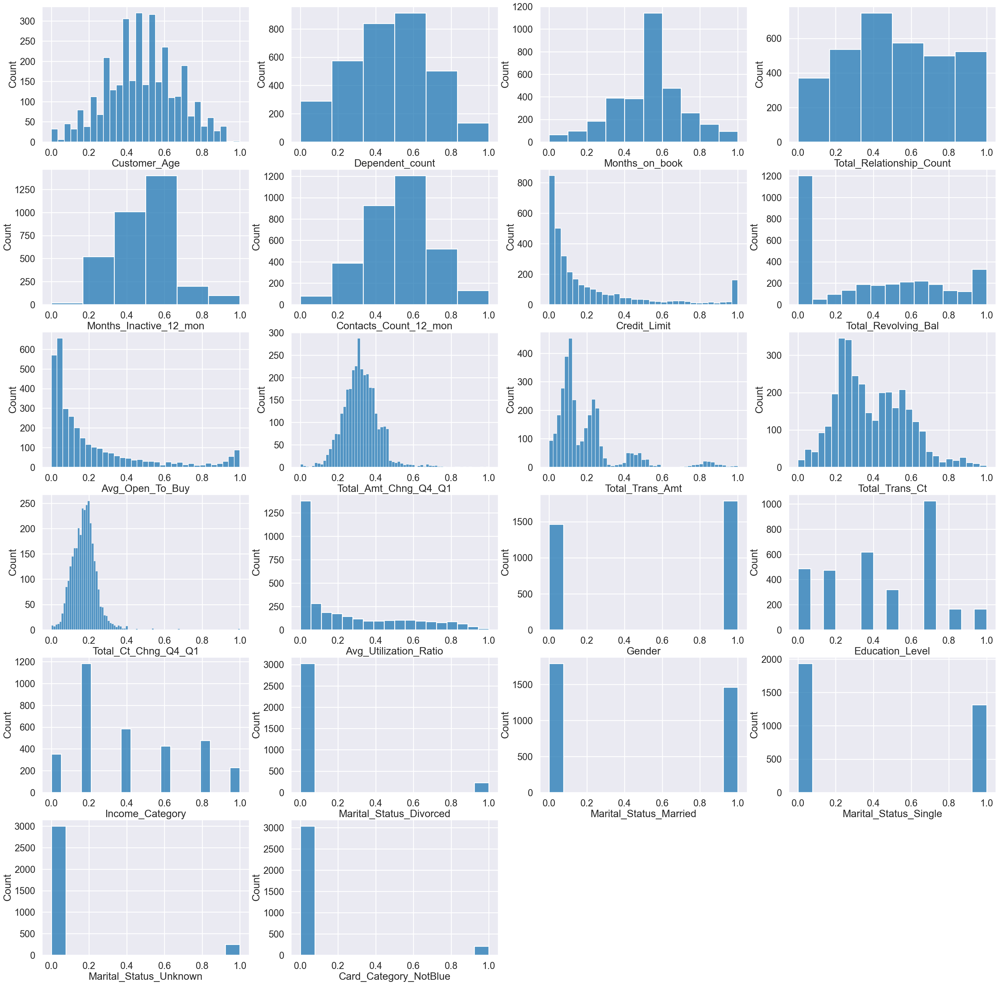

In [2251]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_dwsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_dwsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_dwsampled[col],bins=10)
        else:
            sns.histplot(df_dwsampled[col])

**Strip Plot**

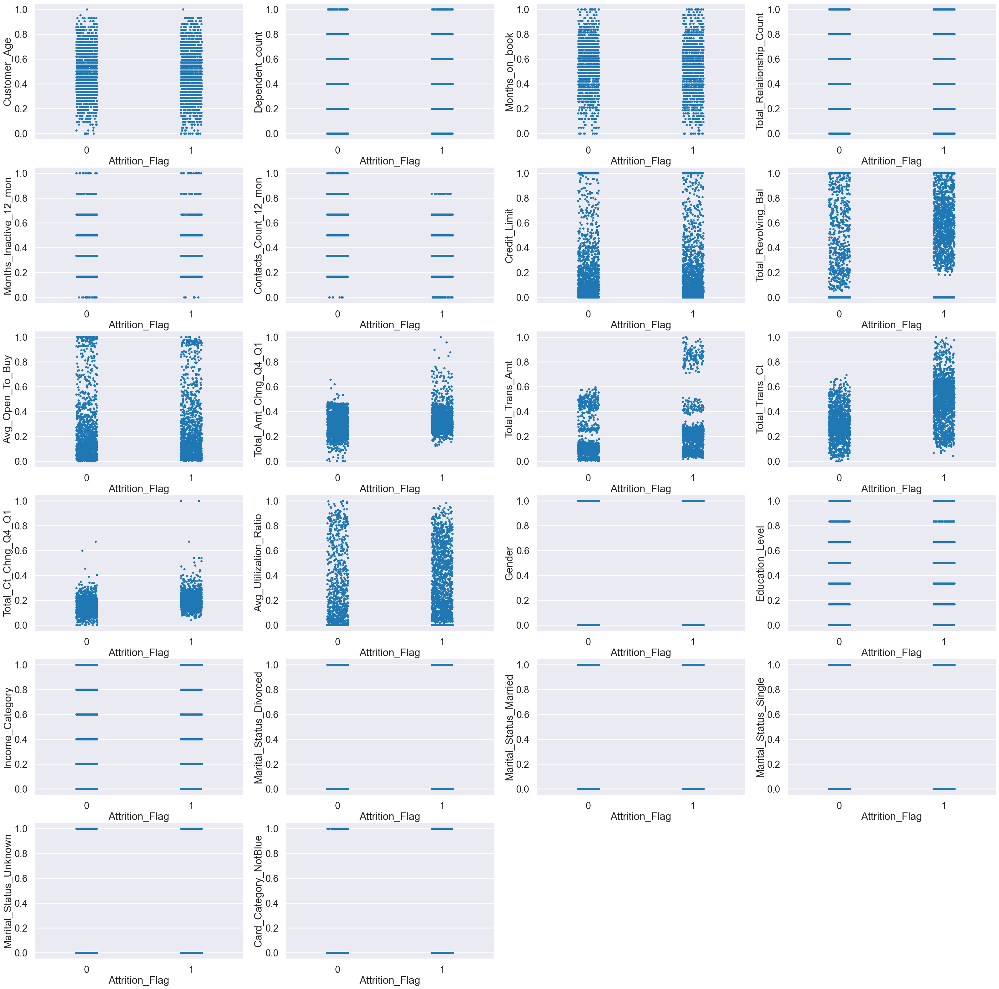

In [2252]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_dwsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_dwsampled)

**Remove Outliers**

In [2253]:
df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Total_Ct_Chng_Q4_Q1'] >= 0.37].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 0].index)
df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Total_Ct_Chng_Q4_Q1'] >= 0.6].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 1].index)
print(df_dwsampled.shape)

df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Total_Amt_Chng_Q4_Q1'] >= 0.425].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 0].index)
df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Total_Amt_Chng_Q4_Q1'] >= 0.8].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 1].index)
print(df_dwsampled.shape)

df_dwsampled = IQRdrop(df_dwsampled, 'Customer_Age')

# print('Before remove outlier, the shape of df_upsampled: {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Avg_Open_To_Buy'] <= 2.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Avg_Open_To_Buy'] <= 2.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# print('df_upsampled.shape after remove outlier Avg_Open_To_Buy : {}'.format(df_upsampled.shape))

# df_upsampled = IQRdrop(df_upsampled, 'Total_Amt_Chng_Q4_Q1')
# # df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 0.38].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# # df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 0.5].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# # print('df_upsampled.shape after remove outlier Total_Amt_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

# # df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Trans_Amt'] >= 16000].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# # print('df_upsampled.shape after remove outlier Total_Trans_Amt : {}'.format(df_upsampled.shape))

# # df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Trans_Ct'] >= 127].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# print('df_upsampled.shape after remove outlier Total_Trans_Amt : {}'.format(df_upsampled.shape))


# df_upsampled = IQRdrop(df_upsampled, 'Total_Ct_Chng_Q4_Q1')
# # df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 0.5].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# # df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] <= 0.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# # print('df_upsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

# # df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 0.55].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# # df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] <= 0.05].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# print('df_upsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

# df_upsampled = IQRdrop(df_upsampled, 'Customer_Age')
# print('df_upsampled.shape after remove outlier Customer_Age : {}'.format(df_upsampled.shape))

(3246, 23)
(3047, 23)


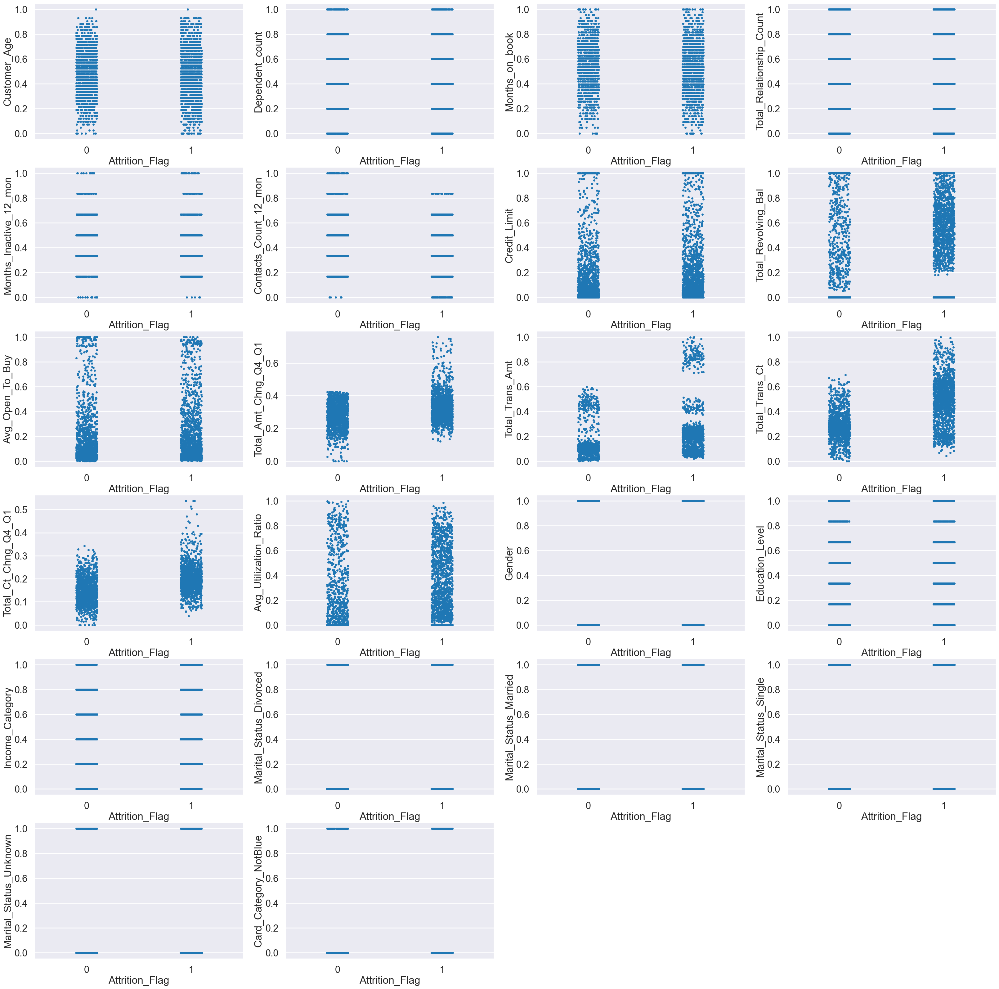

In [2254]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_dwsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_dwsampled)

### **Feature Selection**

In [2255]:
selector_dw_anova = SelectKBest(f_classif, k=9)
x_dw = df_dwsampled.drop(['Attrition_Flag'], axis = 1)
y_dw = df_dwsampled['Attrition_Flag']

df_dw_anova = selector_dw_anova.fit(x_dw, y_dw)

col_dw_anova = selector_dw_anova.get_support(indices=True)
df_dw_anova = x_dw.iloc[:,col_dw_anova]

#### **Concatenate Data**

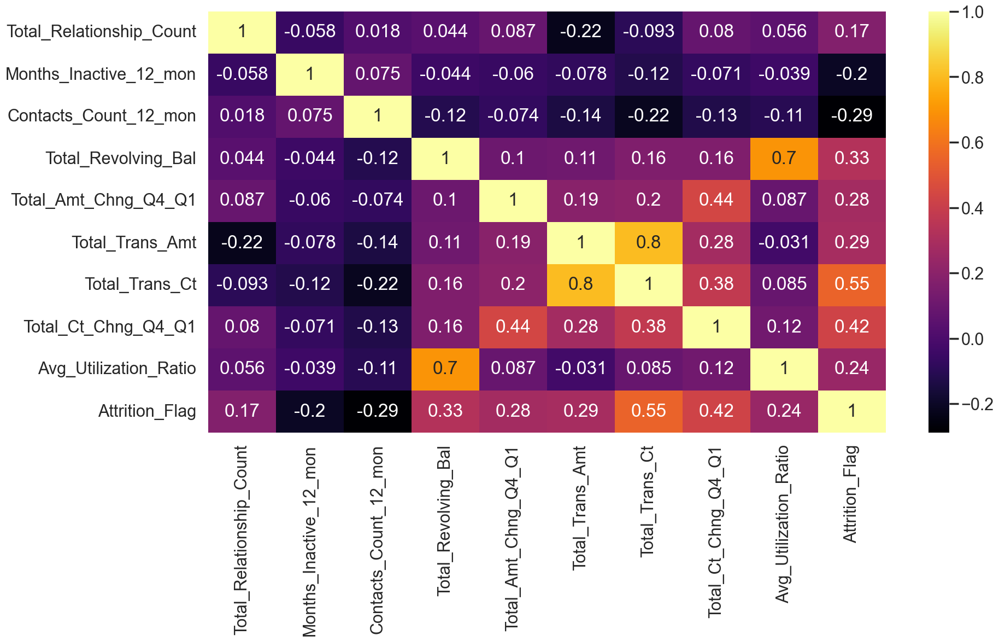

In [2256]:
df_dw_anova = pd.concat([df_dw_anova, y_dw], axis=1)
checkCorrFF(df_dw_anova)

In [2257]:
df_dw_anova.columns

Index(['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio', 'Attrition_Flag'],
      dtype='object')

In [2258]:
df_dw_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Total_Amt_Chng_Q4_Q1'], axis=1, inplace=True)

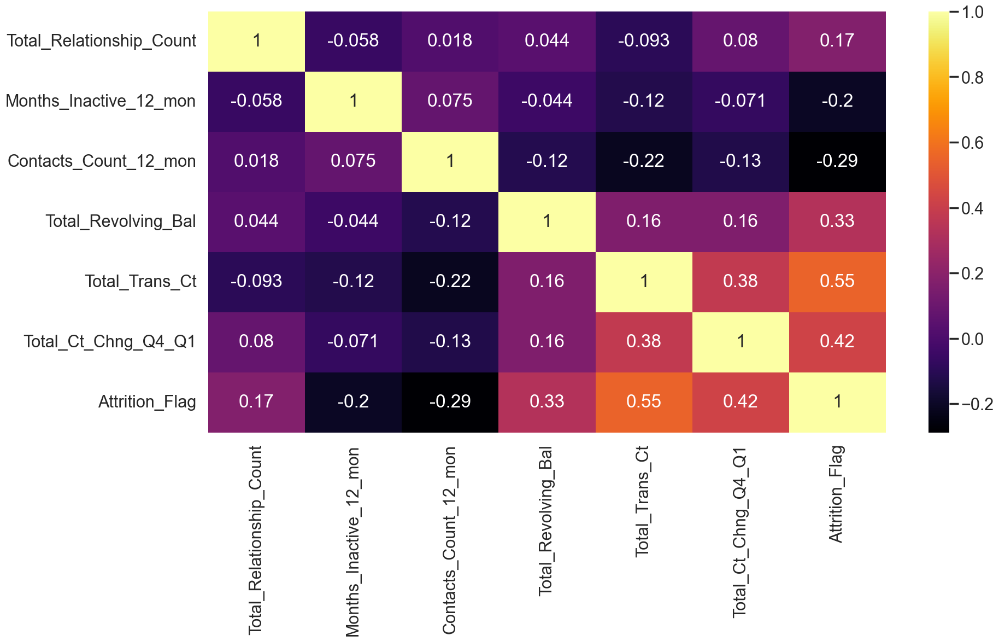

In [2259]:
checkCorrFF(df_dw_anova)

## **Model Training**

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.8409 se=0.006
>f1 score 2 mean=0.8395 se=0.004
>f1 score 3 mean=0.8393 se=0.004
>f1 score 4 mean=0.8388 se=0.003
>f1 score 5 mean=0.8387 se=0.003


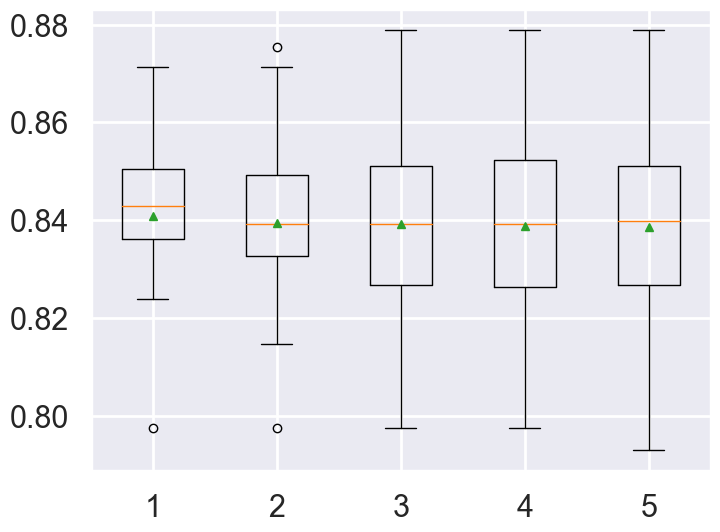

In [2260]:
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from scipy.stats import sem

# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats,scores):
	# prepare the cross-validation procedure
	cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=1)
	# create model
	model = LogisticRegression()
	# evaluate model
	scores = cross_val_score(model, X, y, scoring=scores, cv=cv, n_jobs=-1)
	return scores

# create dataset
X_dw_anova = df_dw_anova.drop(['Attrition_Flag'], axis = 1)
y_dw_anova = df_dw_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_dw_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_dw_anova = evaluate_model(X_dw_anova, y_dw_anova, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_dw_anova), sem(scores_dw_anova)))
	# store
	results_dw_anova.append(scores_dw_anova)
# plot the results
plt.boxplot(results_dw_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [2261]:
from sklearn.model_selection import GridSearchCV

#get the dummy variables for the categorical variables
x_dw_anova = df_dw_anova.drop(['Attrition_Flag'], axis = 1)
y_dw_anova = df_dw_anova['Attrition_Flag']

x_dw_anova_train,x_dw_anova_test,y_dw_anova_train,y_dw_anova_test = train_test_split(x_dw_anova, y_dw_anova, test_size = 0.2, random_state = 0)

grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_dw_anova=LogisticRegression()
logreg_cv_dw_anova=GridSearchCV(logreg_dw_anova
                              ,grid
                              ,cv=10
                              ,scoring='f1'
                              ,n_jobs=-1)
logreg_cv_dw_anova.fit(x_dw_anova_train,y_dw_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_dw_anova.best_params_)
print("f1 :",logreg_cv_dw_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l1', 'solver': 'saga'}
f1 : 0.8394081431148205


In [2262]:
clf_dw_anova = LogisticRegression(C=logreg_cv_dw_anova.best_params_['C']
                                  , penalty=logreg_cv_dw_anova.best_params_['penalty']
                                  , solver=logreg_cv_dw_anova.best_params_['solver'])

clf_dw_anova.fit(x_dw_anova_train,y_dw_anova_train)
print("model score: %.8f" % clf_dw_anova.score(x_dw_anova_test, y_dw_anova_test))

model score: 0.84754098


### **Classification report**

In [2263]:
# Classification report
y_dw_anova_pred = clf_dw_anova.predict(x_dw_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_dw_anova_train, y_pred=y_dw_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_dw_anova_train, y_pred=y_dw_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.82      0.82      0.82      1150
           1       0.84      0.84      0.84      1287

    accuracy                           0.83      2437
   macro avg       0.83      0.83      0.83      2437
weighted avg       0.83      0.83      0.83      2437

Confusion matrix 
[[ 940  210]
 [ 205 1082]]


In [2264]:
# Classification report
y_dw_anova_pred = clf_dw_anova.predict(x_dw_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_dw_anova_test, y_pred=y_dw_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_dw_anova_test, y_pred=y_dw_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.84      0.83      0.83       278
           1       0.86      0.86      0.86       332

    accuracy                           0.85       610
   macro avg       0.85      0.85      0.85       610
weighted avg       0.85      0.85      0.85       610

Confusion matrix 
[[230  48]
 [ 45 287]]


# **Resampling Method 3** : Tomek Links
<hr>

## **Data Preprocessing**

### **Resampling**

In [2265]:
df_LE

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,...,0.061,0,2,3,0,1,0,0,0,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,...,0.105,1,4,1,0,0,1,0,0,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,...,0.000,0,4,4,0,1,0,0,0,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,...,0.760,1,2,1,0,0,0,1,0,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,...,0.000,0,1,3,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,...,0.462,0,4,2,0,0,1,0,0,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,...,0.511,0,0,2,1,0,0,0,0,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,...,0.000,1,2,1,0,1,0,0,0,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,...,0.000,0,4,2,0,0,0,1,0,0


<AxesSubplot:ylabel='Type'>

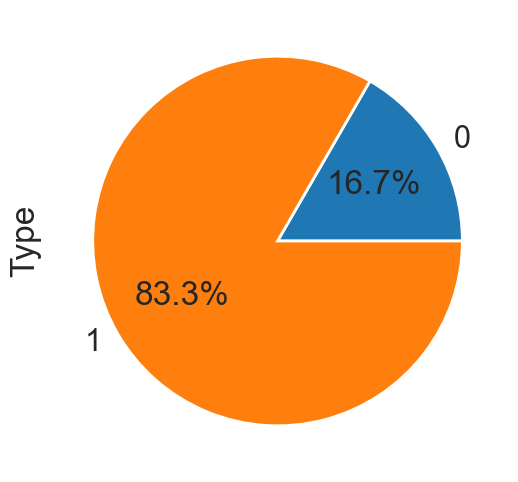

In [2266]:
undersample = TomekLinks()

# transform the dataset
dfX = df_LE.drop(['Attrition_Flag'], axis=1)
dfY = df_LE['Attrition_Flag']
X, y = undersample.fit_resample(dfX, dfY)
dfTomek = pd.concat([X, y], axis=1)

dfTomek.groupby('Attrition_Flag').size().plot(kind='pie',
                                        y = "Attrition_Flag",
                                        label = "Type",
                                        autopct='%1.1f%%')

1    8138
0    1627
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

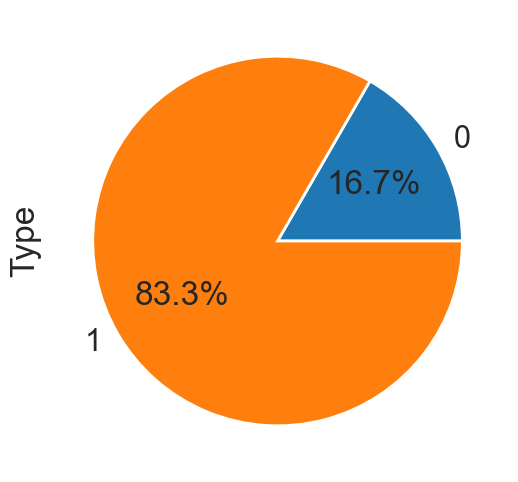

In [2267]:
print(dfTomek["Attrition_Flag"].value_counts())

dfTomek.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

In [2268]:
dfTomek.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,...,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000
mean,46.424270,2.353098,36.003789,3.797542,2.346646,2.452125,8583.148121,1170.278751,7412.869370,0.757711,...,0.277191,0.533436,2.602151,2.077317,0.073733,0.461854,0.389759,0.074654,0.067691,0.833385
std,7.943479,1.297925,7.926336,1.555696,1.009358,1.108183,9058.048223,808.338376,9053.253039,0.215754,...,0.275343,0.498906,1.700524,1.472770,0.261349,0.498568,0.487721,0.262846,0.251227,0.372651
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,32.000000,3.000000,2.000000,2.000000,2542.000000,500.000000,1298.000000,0.631000,...,0.028000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4490.000000,1288.000000,3423.000000,0.736000,...,0.180000,1.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10960.000000,1783.000000,9775.000000,0.857000,...,0.506000,1.000000,4.000000,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,...,0.999000,1.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [2269]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


### **Feature Scaling (Numerical)**

In [2270]:
min_max_scaler = MinMaxScaler()

for idx in dfTomek.columns:
    if idx not in ['Attrition_Flag']:
        dfTomek[idx]=min_max_scaler.fit_transform(dfTomek[idx].values.reshape(-1,1))

In [2271]:
dfTomek.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,...,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000,9765.000000
mean,0.434559,0.470620,0.534972,0.559508,0.391108,0.408687,0.216002,0.464950,0.214698,0.223053,...,0.277468,0.533436,0.433692,0.415463,0.073733,0.461854,0.389759,0.074654,0.067691,0.833385
std,0.169010,0.259585,0.184333,0.311139,0.168226,0.184697,0.273842,0.321152,0.262314,0.063513,...,0.275619,0.498906,0.283421,0.294554,0.261349,0.498568,0.487721,0.262846,0.251227,0.372651
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.319149,0.200000,0.441860,0.400000,0.333333,0.333333,0.033367,0.198649,0.037522,0.185752,...,0.028028,0.000000,0.166667,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.425532,0.400000,0.534884,0.600000,0.333333,0.333333,0.092259,0.511720,0.099093,0.216662,...,0.180180,1.000000,0.500000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.553191,0.600000,0.627907,0.800000,0.500000,0.500000,0.287859,0.708383,0.283140,0.252281,...,0.506507,1.000000,0.666667,0.600000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [2272]:
dfTomek.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9765 entries, 0 to 9764
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              9765 non-null   float64
 1   Dependent_count           9765 non-null   float64
 2   Months_on_book            9765 non-null   float64
 3   Total_Relationship_Count  9765 non-null   float64
 4   Months_Inactive_12_mon    9765 non-null   float64
 5   Contacts_Count_12_mon     9765 non-null   float64
 6   Credit_Limit              9765 non-null   float64
 7   Total_Revolving_Bal       9765 non-null   float64
 8   Avg_Open_To_Buy           9765 non-null   float64
 9   Total_Amt_Chng_Q4_Q1      9765 non-null   float64
 10  Total_Trans_Amt           9765 non-null   float64
 11  Total_Trans_Ct            9765 non-null   float64
 12  Total_Ct_Chng_Q4_Q1       9765 non-null   float64
 13  Avg_Utilization_Ratio     9765 non-null   float64
 14  Gender  

### **Clear outlier**

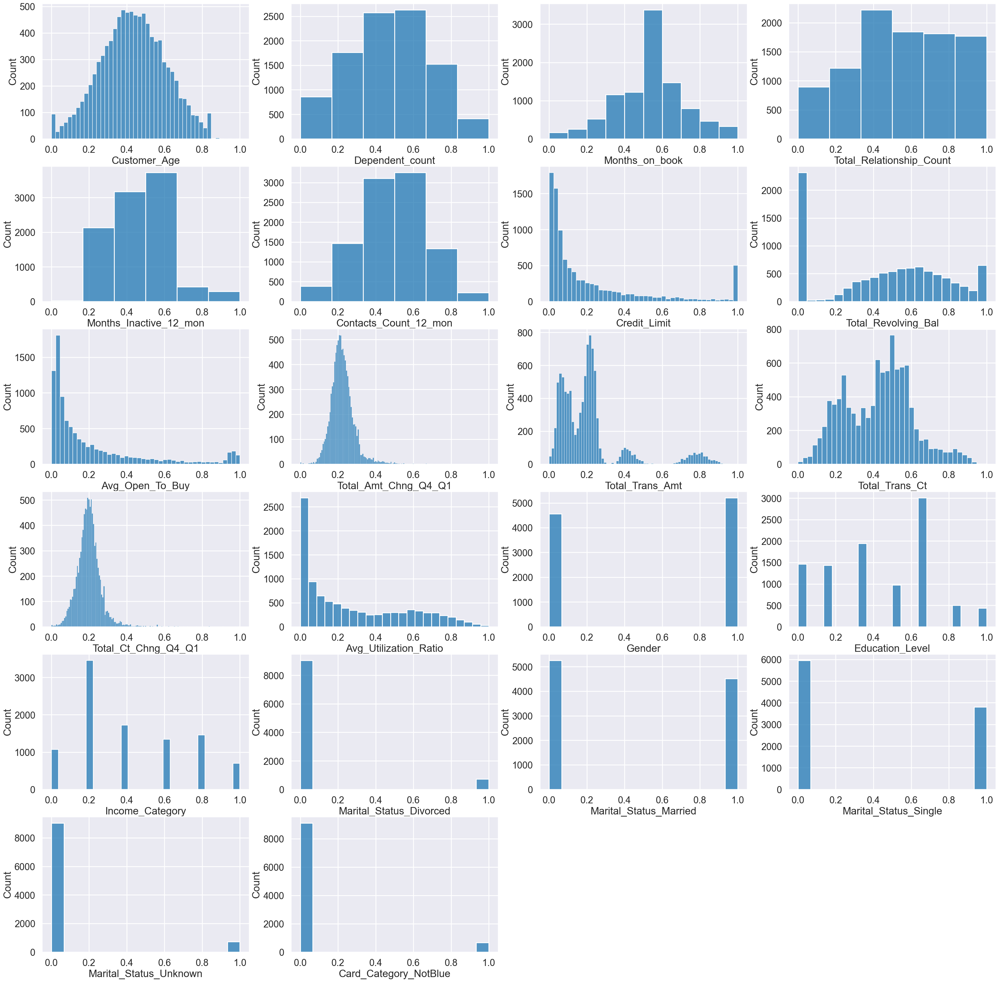

In [2273]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(dfTomek.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfTomek[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfTomek[col],bins=10)
        else:
            sns.histplot(dfTomek[col])

**Strip Plot**

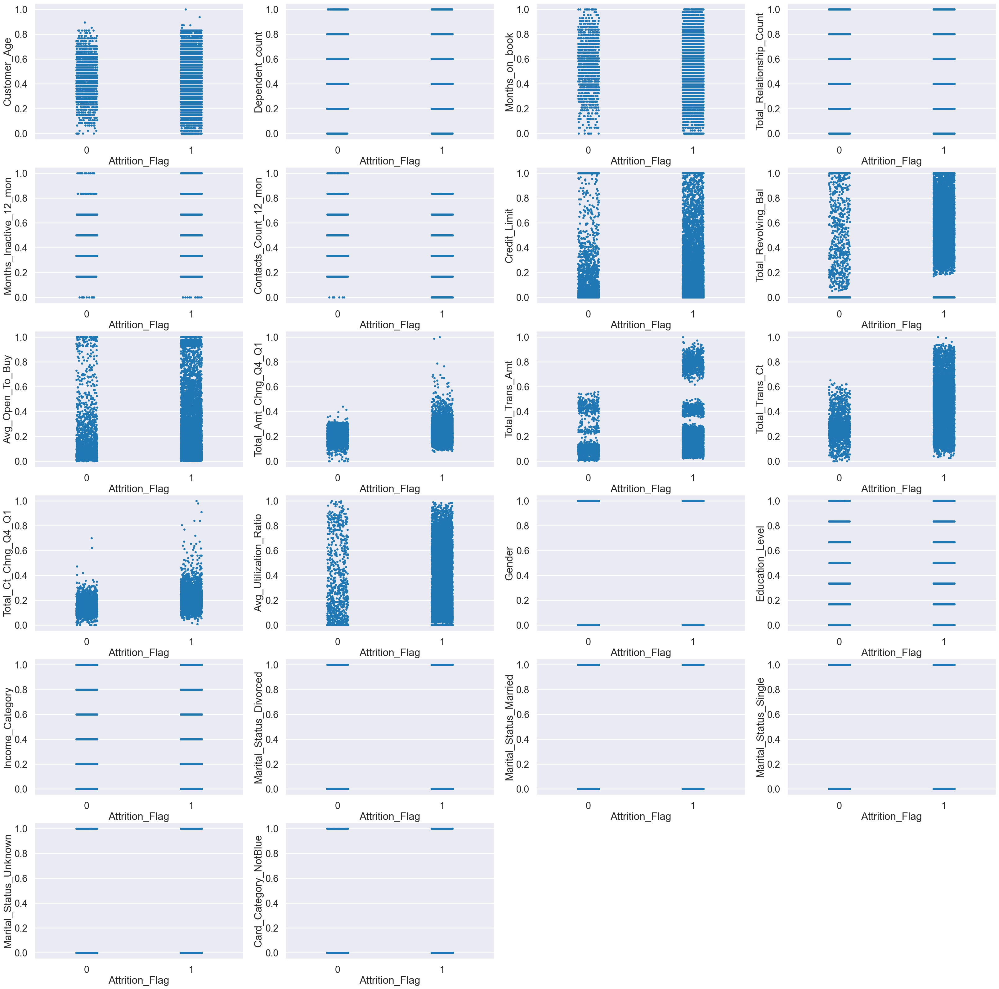

In [2274]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(dfTomek.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=dfTomek)

**Remove Outliers**

In [2275]:
dfTomek = dfTomek.drop(dfTomek[dfTomek['Total_Ct_Chng_Q4_Q1'] >= 0.37].index & dfTomek[dfTomek['Attrition_Flag'] == 0].index)
dfTomek = dfTomek.drop(dfTomek[dfTomek['Total_Ct_Chng_Q4_Q1'] >= 0.7].index & dfTomek[dfTomek['Attrition_Flag'] == 1].index)
dfTomek = IQRdrop(dfTomek, 'Customer_Age')

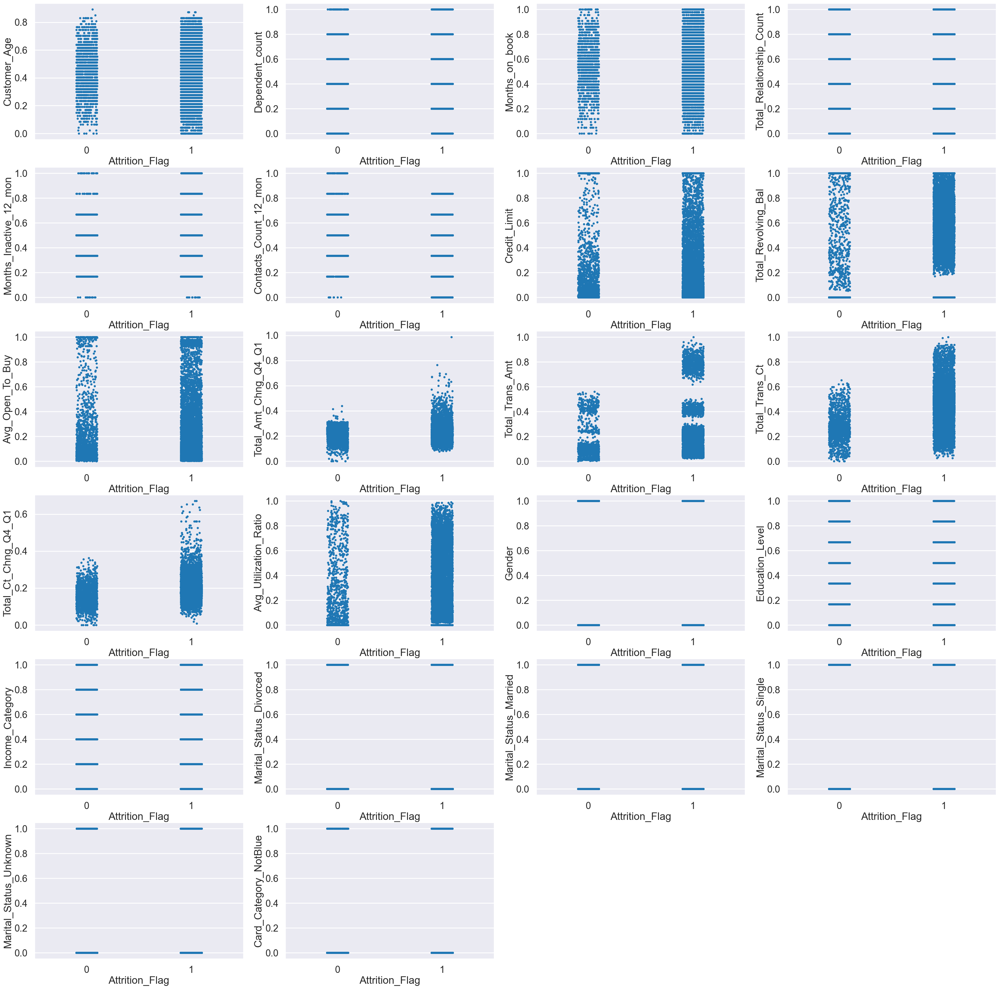

In [2276]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(dfTomek.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=dfTomek)

### **Feature Selection**

In [2277]:
selector_tm = SelectKBest(f_classif, k=9)
x_tm = dfTomek.drop(['Attrition_Flag'], axis = 1)
y_tm = dfTomek['Attrition_Flag']

df_tm_anova = selector_tm.fit(x_tm, y_tm)

col_tm = selector_tm.get_support(indices=True)
df_tm_anova = x_tm.iloc[:,col_tm]

#### **Concatenate Data**

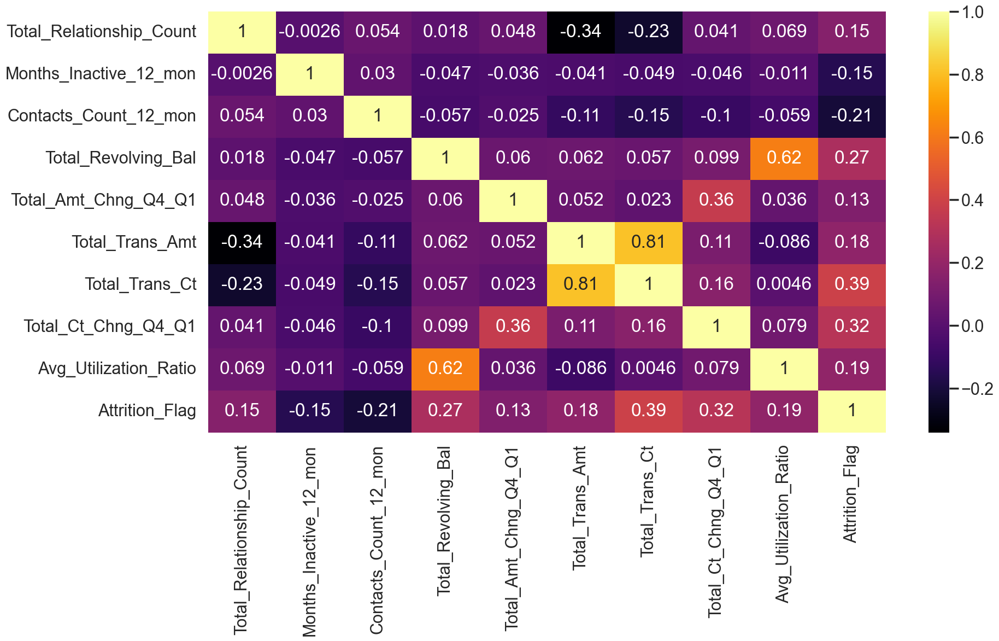

In [2278]:
df_tm_anova = pd.concat([df_tm_anova, y_tm], axis=1)
checkCorrFF(df_tm_anova)

In [2279]:
df_tm_anova.columns

Index(['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio', 'Attrition_Flag'],
      dtype='object')

In [2280]:
df_tm_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Total_Amt_Chng_Q4_Q1'], axis=1, inplace=True)

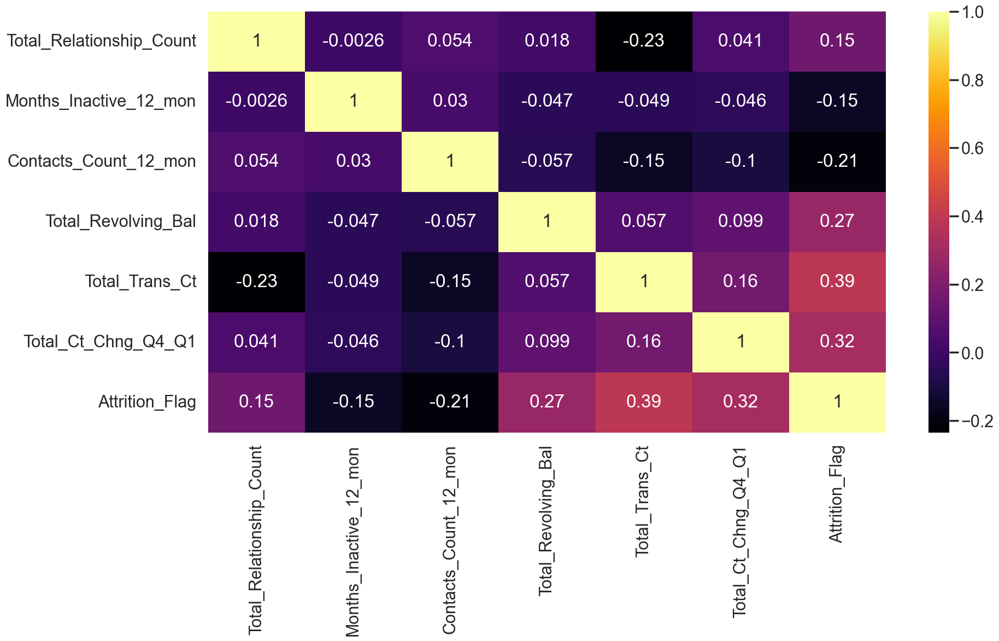

In [2281]:
checkCorrFF(df_tm_anova)

## **Model Training**

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.9390 se=0.003
>f1 score 2 mean=0.9392 se=0.002
>f1 score 3 mean=0.9392 se=0.001
>f1 score 4 mean=0.9392 se=0.001
>f1 score 5 mean=0.9392 se=0.001


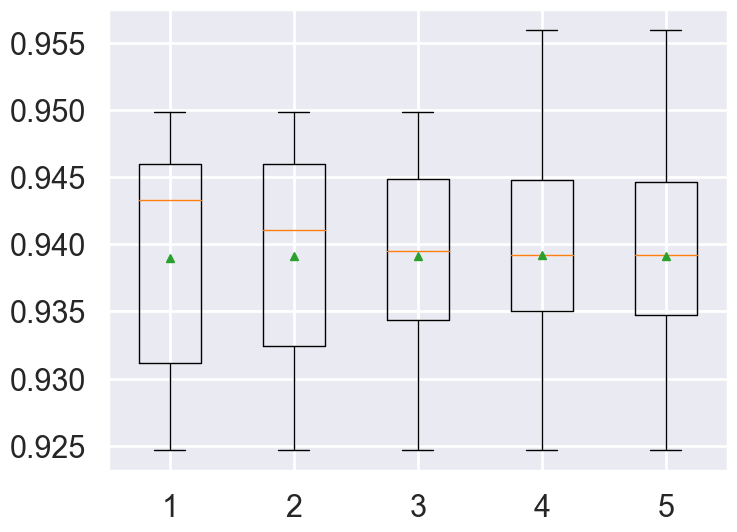

In [2282]:
# create dataset
X_tm_anova = df_tm_anova.drop(['Attrition_Flag'], axis = 1)
y_tm_anova = df_tm_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_tm_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_tm_anova = evaluate_model(X_tm_anova, y_tm_anova, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_tm_anova), sem(scores_tm_anova)))
	# store
	results_tm_anova.append(scores_tm_anova)
# plot the results
plt.boxplot(results_tm_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [2283]:
#get the dummy variables for the categorical variables
x_tm_anova = df_tm_anova.drop(['Attrition_Flag'], axis = 1)
y_tm_anova = df_tm_anova['Attrition_Flag']

x_tm_anova_train,x_tm_anova_test,y_tm_anova_train,y_tm_anova_test = train_test_split(x_tm_anova, y_tm_anova, test_size = 0.2, random_state = 0)

grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_tm_anova=LogisticRegression()
logreg_cv_tm_anova=GridSearchCV(logreg_tm_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1'
                       ,n_jobs=-1)
logreg_cv_tm_anova.fit(x_tm_anova_train,y_tm_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_tm_anova.best_params_)
print("f1 :",logreg_cv_tm_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 10.0, 'penalty': 'l2', 'solver': 'liblinear'}
f1 : 0.9404574911492626


In [2284]:
clf_tm_anova = LogisticRegression(C=logreg_cv_tm_anova.best_params_['C']
                                  , penalty=logreg_cv_tm_anova.best_params_['penalty']
                                  , solver=logreg_cv_tm_anova.best_params_['solver'])

clf_tm_anova.fit(x_tm_anova_train,y_tm_anova_train)
print("model score: %.8f" % clf_tm_anova.score(x_tm_anova_test, y_tm_anova_test))

model score: 0.89128205


### **Classification report**

In [2285]:
# Classification report
y_tm_anova_pred = clf_tm_anova.predict(x_tm_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_tm_anova_train, y_pred=y_tm_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_tm_anova_train, y_pred=y_tm_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.77      0.54      0.63      1280
           1       0.91      0.97      0.94      6520

    accuracy                           0.90      7800
   macro avg       0.84      0.75      0.79      7800
weighted avg       0.89      0.90      0.89      7800

Confusion matrix 
[[ 686  594]
 [ 202 6318]]


In [2286]:
# Classification report
y_tm_anova_pred = clf_tm_anova.predict(x_tm_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_tm_anova_test, y_pred=y_tm_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_tm_anova_test, y_pred=y_tm_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.76      0.55      0.64       342
           1       0.91      0.96      0.94      1608

    accuracy                           0.89      1950
   macro avg       0.84      0.76      0.79      1950
weighted avg       0.88      0.89      0.88      1950

Confusion matrix 
[[ 188  154]
 [  58 1550]]
